In [1]:
%load_ext autoreload
%autoreload 2
#required packages
import os
import glob
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
from scipy import signal, stats
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale, minmax_scale
from sklearn import cluster
import pickle
from datetime import datetime
from tqdm import tqdm
from scikit_posthocs import posthoc_dunn
#need to run as administrator, otherwise takes too long
# import umap
#my funcs
from ecog_functions import *

#inductive 
from sklearn.base import BaseEstimator, clone
from sklearn.cluster import AgglomerativeClustering
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.utils.metaestimators import available_if
from sklearn.utils.validation import check_is_fitted

In [2]:
def sort_cls_by_criteria(grouped):
    """Sorts clusters by a decision tree. 
    Splits by EMG, then by alpha*delta, then beta*gamma, then theta - needs an update
    Modify this function to modify results

    Args:
        grouped (dataframe): dataframe of clusters and their median parameters

    Returns:
        w_cls: clusters marked as wake
        same for other outputs
    """
        
    w_cls = []
    nrem_cls = []
    rem_cls = []
    
    unsorted_cls = grouped.index
    for cluster in unsorted_cls:
        #option 5 - HIGH or not, no ratios
        nonzero = grouped.iloc[:,0:6]>grouped.iloc[:,0:6].quantile(0.25)
        high = grouped.iloc[:,0:6]>grouped.iloc[:,0:6].quantile(0.5)
        very_high = grouped.iloc[:,0:6]>grouped.iloc[:,0:6].quantile(0.75)
        #NREM
        #if not high['emg'][cluster]:
        if high['delta'][cluster] or high['alpha'][cluster] or high['theta'][cluster]:
            if very_high['theta'][cluster] and (nonzero['beta'][cluster] and nonzero['gamma'][cluster]) and not nonzero['emg'][cluster]:
                rem_cls.append(cluster)
            elif (high['delta'][cluster] or high['alpha'][cluster] or high['theta'][cluster]) and not high['emg'][cluster]:
                nrem_cls.append(cluster)
            else:
                w_cls.append(cluster)
        else:
            w_cls.append(cluster)
    #make sure there is at least one REM cluster detected
    #if there are no REM clusters, select the one with highest theta, lowest emg and nonzero beta/gamma
    if not rem_cls:
        #scale gr to allow index calculation
        grouped.iloc[:,:-2] = minmax_scale(grouped.iloc[:,:-2])
        #rem index
        rem_ind = (grouped['theta']**2 * grouped['beta']*grouped['gamma'])/(grouped['emg']**2)
        rem_cls.append(np.where(rem_ind == rem_ind.max())[0][0])
        
    return w_cls, nrem_cls, rem_cls

In [3]:
def integrate_by_mode(data, integration_s = 5):
    """Integrates data by the mode of selected interval - replaces all values with the most common. 
    Works as a rolling filter.

    Args:
        data (pandas series): data of sleep detections (in this case) - N, R, and W categories. 
        integration_s (int, optional): size of window. Defaults to 5.

    Returns:
        res_sleep: list of updated results.
    """
    #temporal integration - select most common state in set s to drop a bit of noise
    res_sleep=[]
    #nans bfilled - should figure out a better method, ran out of time
    raw_sleep=data.reset_index(drop=True).fillna(method='bfill')
    for i in tqdm(range(0, len(raw_sleep)-integration_s)):
        #take most common value in 5s if it exists (not NaN)
        mode = raw_sleep[i:i+integration_s].mode()[0]
        #print(mode)
        if mode !=0:
            res_sleep.append(mode[0])
        else:
            print('weird error, mode=0')
    return res_sleep

In [4]:
#motion sensor funcs
def preprocess_sensor(data, name):
    """removes repeated values, makes sure the data starts with ON state and ends with OFF, sets a datetime index

    Args:
        data (pandas df): data - state and timestamp
        name (str): what to rename the sensor to

    Returns:
        data: df of preprocessed data
    """
    
    #if there are any repeated values, remove them
    data = data[data['movement'].diff()!=0]
    
    #check length
    if len(data['movement']) < 10:
        print('len data < 10')
        return None
    
    #make sure rec starts with 1, ends with 0
    if data['movement'].iloc[0] == 0:
        data = data.iloc[1:]
    if data['movement'].iloc[-1] != 0:
        data = data.iloc[:-2]
    
    #set index to time, drop time and id
    data = data.set_index(pd.to_datetime(data['time'])).drop(['time','id'],axis=1)
    #use name instead of ID
    data['sensor'] = name
    return data

def generate_binary_ms(sensor):
    """generates a continuous 1ms array of time and state (ON/OFF), basically resampling

    Args:
        sensor (pandas df): state and timestamp
        
    Returns:
        ms_df: continuous df of 1 ms freq, state is marked
    """
    #create array of ms from start
    ms_ind = np.arange(sensor['ms_from_start'][0], sensor['ms_from_start'][-1])
    #select subset where movement ==1
    on_ms = sensor['ms_from_start'].iloc[np.where(sensor['movement']==1)].to_numpy()
    #select subset where movement ==0
    off_ms = sensor['ms_from_start'].iloc[np.where(sensor['movement']==0)].to_numpy()
    #create dataframe with 1ms freq time index
    ms_df = pd.DataFrame(ms_ind, index = pd.date_range(start = sensor.index[0], periods = len(ms_ind), freq='1ms'), columns = ['ms_from_start'])
    #mark ON/OFF
    ms_df['state'] = np.NaN
    ms_df['state'].loc[ms_df['ms_from_start'].isin(on_ms)] = 1
    ms_df['state'].loc[ms_df['ms_from_start'].isin(off_ms)] = 0
    #interpolate
    ms_df['state'] = ms_df['state'].interpolate(method = 'ffill')
    
    return ms_df

In [5]:
#random funcs
def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

In [6]:
#global params
DATA_PATH = r'C:\Users\marty\Projects\sleep_new\res_temp\*'
#CLUSTER_RES_PATH = './res_temp/grouped_cls_*_final_50cl.pkl'
SUFFIX = '_clustered_rolled_50cl_fullfixed.pkl'

In [8]:
#load all data here - check paths
paths = glob.glob(DATA_PATH+SUFFIX)
#below if selecting a specific day
#paths = [path for path in paths if '20232805' in path]
print(f'id is {paths[0][43:45]}')
print(paths[0])

id is 10
C:\Users\marty\Projects\sleep_new\res_temp\10_20230604_clustered_rolled_50cl_fullfixed.pkl


In [9]:
#rats can be selected to be excluded
to_exclude=[]

In [10]:
#will not run this cell if no new data is added
#loading data and sorting clusters - should be moved to a function later
data=[]
for path in paths:
    data_single = pickle.load(open(path, 'rb'))
    id = path[43:45]
    data_single['id'] = id
    print(id)
    #sel rats to drop
    if id in to_exclude:
        continue
    
    #loading and sorting cls
    #this is also done in preprocessing, but it would need to be run again :)
    #besides, one clusterer is trained per rat, so doing it here shoudn't make a difference
    gr=data_single[['delta','theta','alpha','beta','gamma','emg','cluster']].groupby('cluster').mean()
    gr['cluster']=data_single[['delta','theta','alpha','beta','gamma','emg','cluster']].groupby('cluster').mean().index
    gr['sleep']='unknown'
    
    #if using preset cluster descriptions (ex. medians)
    # sel_gr_path = [gr_path for gr_path in gr_paths if id in gr_path][0]
    # gr = pickle.load(open(sel_gr_path, 'rb'))
    # gr.iloc[:,:-2] = scale(gr.iloc[:,:-2])

    #run a cluster sorting function
    w_cls, nrem_cls, rem_cls = sort_cls_by_criteria(gr)
   
    #add this to feature df
    data_single['sleep']=np.NaN
    data_single['sleep'][data_single['cluster'].isin(w_cls)] = 'W'
    data_single['sleep'][data_single['cluster'].isin(nrem_cls)] = 'N'
    data_single['sleep'][data_single['cluster'].isin(rem_cls)] = 'R'
    data_single.fillna(method='ffill')
    
    #remove REM detections if they follow W
    for i in range(0, len(data_single['sleep'])):
        if (i>=5) and (data_single['sleep'].iloc[i]=='R'):
            if 'W' in data_single['sleep'].iloc[i-5:i].tolist():
                data_single['sleep'].iloc[i]='W'
                #print('removed')
    integration_s = 15
    data_single['sleep'].iloc[0:-integration_s]=integrate_by_mode(data_single['sleep'], integration_s=integration_s)
    #here data is put back together - might need to rethink if there is too much data
    data.append(data_single)
data=pd.concat(data)

In [11]:
#saving for quick loading 
pickle.dump(data, open('./res_temp/sleep_sorted_data4.pkl', 'wb'))

In [12]:
#loading - if running the code from the start, not needed
data = pickle.load(open('./res_temp/sleep_sorted_data4.pkl', 'rb'))
data

,delta,theta,alpha,beta,gamma,emg,cluster,id,sleep
2023-04-06 00:12:38.000,-0.332743,-0.187328,0.719374,-0.117790,-0.666971,-0.060496,35,10,N
2023-04-06 00:12:39.000,-0.332743,-0.187328,0.719374,-0.117790,-0.666971,-0.060496,35,10,N
2023-04-06 00:12:40.000,-0.332743,-0.187328,0.719374,-0.117790,-0.666971,-0.060496,35,10,N
2023-04-06 00:12:41.000,-0.332743,-0.187328,0.719374,-0.117790,-0.666971,-0.060496,35,10,N
2023-04-06 00:12:42.000,-0.332743,-0.187328,0.719374,-0.117790,-0.666971,-0.060496,35,10,N
...,...,...,...,...,...,...,...,...,...
2023-04-10 00:54:48.150,0.329618,-0.188244,-0.337566,-0.367914,-0.176357,-0.108095,26,8_,N
2023-04-10 00:54:49.150,0.365719,-0.202041,-0.337566,-0.432749,-0.177046,-0.108095,26,8_,N
2023-04-10 00:54:50.150,0.365719,-0.202041,-0.357356,-0.490787,-0.177046,-0.108095,26,8_,N
2023-04-10 00:54:51.150,0.365719,-0.202041,-0.379386,-0.490787,-0.187978,-0.108095,26,8_,N


In [13]:
#somewhat realistic params 
data['sleep'].value_counts()/len(data['sleep'])*100

N    51.123065
W    45.712709
R     3.164225
Name: sleep, dtype: float64

In [14]:
data['id'].unique()

array(['10', '11', '12', '13', '14', '16', '21', '23', '24', '25', '26',
       '31', '32', '33', '34', '35', '41', '42', '43', '44', '45', '46',
       '51', '52', '53', '54', '55', '5_', '6_', '7_', '8_'], dtype=object)

In [15]:
#check if rats have comparable values - seem to
(data.groupby('id')['sleep'].value_counts()/data.groupby('id')['sleep'].count()).T

id  sleep
10  W        0.553747
    N        0.403294
    R        0.042959
11  N        0.568204
    W        0.363446
               ...   
7_  N        0.382671
    R        0.048965
8_  W        0.486464
    N        0.478442
    R        0.035094
Name: sleep, Length: 93, dtype: float64

In [16]:
#check params of states
data.groupby(['sleep']).median().apply(minmax_scale)
#this tells me that delta is related to noise, which is probably the main issue

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\204711482.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data.groupby(['sleep']).median().apply(minmax_scale)


,delta,theta,alpha,beta,gamma,emg,cluster
sleep,,,,,,,
N,0.633835,0.126489,1.000000,0.336976,0.000000,0.087913,0.0
R,0.000000,1.000000,0.961809,1.000000,1.000000,0.000000,1.0
W,1.000000,0.000000,0.000000,0.000000,0.061552,1.000000,0.0


In [17]:
#join sensors to ephys here
s_out = []
#paths of sensor data
paths1 = glob.glob(r"G:\DATA\tween_cbn_sleep\motion_data_1\*")
paths2 = glob.glob(r"G:\DATA\tween_cbn_sleep\motion_data_2\*")
paths3 = glob.glob(r"G:\DATA\tween_cbn_sleep\motion_data_3\*")
paths4 = glob.glob(r"G:\DATA\tween_cbn_sleep\motion_data_4\*")

sensor_paths = [paths1, paths2, paths3, paths4]
#conversion of pin to id
pin_to_id_1={2:21,4:23,5:24,6:25,7:26}
pin_to_id_2={2:31,3:32,4:33,5:34,6:35}
pin_to_id_3={2:41,3:42,4:43,5:44,6:45,7:46}
pin_to_id_4={2:51,3:52,4:53,5:54,6:55}
pins_to_id = [pin_to_id_1, pin_to_id_2, pin_to_id_3, pin_to_id_4]

In [18]:
# # #don't run every time, time consuming! generates a binary array for each rec
#every s to match ephys data, later resample to 30min
for i, sensor_path in enumerate(sensor_paths):
    pin_to_id = pins_to_id[i]
    for path in tqdm(sensor_path):
        sensors = pd.read_csv(path, header = None, names = ['time','id','ms_from_start','movement'])
        sensors = sensors.replace({'id':pin_to_id})
        for id in sensors['id'].unique():
            sensor = preprocess_sensor(sensors[sensors['id']==id], name = id)
            if sensor is None:
                print('nonetype found')
                continue
            sensor = generate_binary_ms(sensor)
            sensor = sensor.resample('1s').sum().drop('ms_from_start', axis=1)
            sensor['id'] = id
            sensor['state'] = minmax_scale(sensor['state'])
            s_out.append(sensor)
sensors = pd.concat(s_out)

In [19]:
# #add old data
w_sensor_list = []
w_sens_paths = glob.glob(r"C:\Users\marty\Documents\DATA\water_soluble_cbn_sleep\*\movement_sensors\test*.csv")
for path in w_sens_paths:
    id = path[-48:-46].strip('\\')
    w_single = pd.read_csv(path, header = None)
    if len(w_single) >= 100:
        w_single.columns = ['movement', 'time']
        w_single['id'] = id
        w_single = preprocess_sensor(w_single, id)
        if w_single is None:
            print('nonetype found')
            continue
        w_single['state'] = w_single['movement'].astype('float')
        w_single.index = [ind[:-6] for ind in w_single.index.astype('str')]
        w_single.index = pd.to_datetime(w_single.index)
        w_single = w_single.drop(['sensor', 'movement'], axis = 1)
        w_single = w_single.resample('1s').sum()
        w_single['id'] = id
        w_sensor_list.append(w_single)
#clean up old data to match new
w_sensors = pd.concat(w_sensor_list)
sensors = pd.concat([sensors, w_sensors])

In [20]:
#pickle dump sensor data
pickle.dump(sensors, open('./res_temp/sensor_data4.pkl', 'wb'))

In [21]:
#load sensor data to avoid rerunning time consuming code
sensors = pickle.load(open('./res_temp/sensor_data3.pkl', 'rb'))

In [22]:
sensors['id'].loc[sensors['id'] == '5'] = '5_'
sensors['id'].loc[sensors['id'] == '6'] = '6_'
sensors['id'].loc[sensors['id'] == '7'] = '7_'
sensors['id'].loc[sensors['id'] == '8'] = '8_'
sensors['id'].loc[sensors['id'] == '9'] = '9_'
sensors['id'].unique()

array([25, 24, 23, 26, 21, 33, 35, 34, 31, 32, 43, 42, 41, 46, 45, 44, 51,
       52, 54, 53, 55, '10', '11', '12', '13', '14', '15', '16', '5_',
       '6_', '7_', '8_', '9_'], dtype=object)

In [23]:
#add to ephys - first, mark as nans
data['sensor'] = np.NaN
#convert sensor ids to the same type as data ids
data['id'] = data['id'].astype(str)
sensors['id'] = sensors['id'].astype(str)
#round indices to 1s
data.index = data.index.round('1s')
sensors.index = sensors.index.round('1s')
#get rat ids
ids = data['id'].unique().astype(str)

In [24]:
#concat ephys and sensors - some rats excluded due to missing sensor data
data_temp = []
for id in tqdm(ids):
    rat_df = data[data['id'] == id]
    sens_df = sensors[sensors['id'] == id]
    #remove duplicated indices
    rat_df = rat_df[~rat_df.index.duplicated(keep='first')]
    sens_df = sens_df[~sens_df.index.duplicated(keep='first')]
    if len(sens_df) > 0:
        # print(id)
        rat_df['sensor'] = sens_df['state']
        data_temp.append(rat_df)
    else:
        print(f'no data for {id}')
data = pd.concat(data_temp)
data = data.dropna()

100%|██████████| 31/31 [01:21<00:00,  2.64s/it]


C:\Users\marty\AppData\Local\Temp\ipykernel_17852\2437998869.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data[for_corr].rename(col_renaming_dict, axis = 'columns').corr(), vmin=-1, vmax=1, annot=True, cmap='bwr')


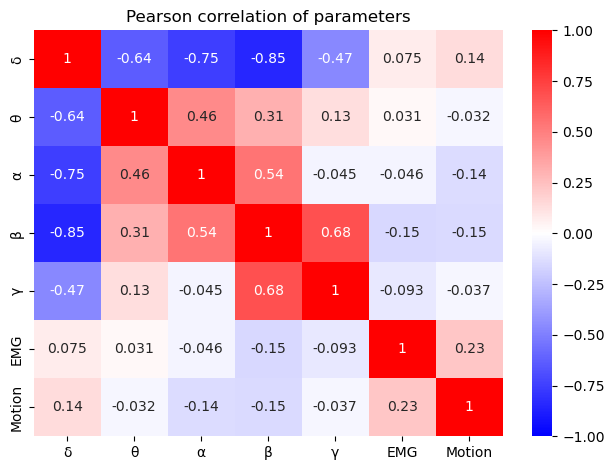

In [26]:
#check correlation
col_renaming_dict = {'delta':'δ', 'theta':'θ', 'alpha':'α', 'beta':'β', 'gamma':'γ', 'emg':'EMG', 'sensor':'Motion'}
for_corr = ['delta', 'theta', 'alpha', 'beta', 'gamma', 'emg', 'sensor', 'sleep']
sns.heatmap(data[for_corr].rename(col_renaming_dict, axis = 'columns').corr(), vmin=-1, vmax=1, annot=True, cmap='bwr')
plt.title('Pearson correlation of parameters')
plt.tight_layout()
plt.savefig('plots/param_corr.png', dpi = 300, transparent = True)

In [27]:
#see state params - my classification is imperfect, but not tragic
(data.groupby('sleep').mean()).dropna(axis = 1).drop('cluster', axis=1).T
#save to excel
(data.groupby('sleep').mean()).dropna(axis = 1).drop('cluster', axis=1).T.to_excel('results/params_by_sleep_state.xlsx')

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\2957966225.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  (data.groupby('sleep').mean()).dropna(axis = 1).drop('cluster', axis=1).T
C:\Users\marty\AppData\Local\Temp\ipykernel_17852\2957966225.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  (data.groupby('sleep').mean()).dropna(axis = 1).drop('cluster', axis=1).T.to_excel('results/params_by_sleep_state.xlsx')


In [28]:
#freq to resample to
freq = '30min'
#if freq = 60 min change start to 08:00 and end to 07:59, if = 30 or below keep 08:30 and 08:29
time_list = pd.date_range(start = '08:30:00', end = '23:59:59', freq = freq).strftime('%H:%M').tolist()
time_list.extend(pd.date_range(start = '00:00:00', end = '08:29:59', freq = freq).strftime('%H:%M').tolist())
#create an ordered categorical index
from pandas.api.types import CategoricalDtype
cat_type = CategoricalDtype(categories=time_list,ordered=True)

In [29]:
#creating a resampled df with sensors included
out_list = []
for rat in tqdm(data['id'].unique()):
    onerat = data[data['id']==rat]
    index = onerat.resample(freq).count().index
    total_count = onerat.resample(freq).count().iloc[:,0]
    nrem_count = onerat[onerat['sleep'] == 'N'].resample(freq).count().iloc[:,0]
    rem_count = onerat[onerat['sleep'] == 'R'].resample(freq).count().iloc[:,0]
    w_count = onerat[onerat['sleep'] == 'W'].resample(freq).count().iloc[:,0]
    sensor_val = onerat['sensor'].resample(freq).sum()
    id = pd.Series(data = rat, index = index)
    out_onerat = pd.DataFrame([total_count, 
                             nrem_count/total_count, 
                             rem_count/total_count, 
                             w_count/total_count, sensor_val, id]).T
    out_onerat.index = index
    out_onerat.columns = ['total_count','nrem_perc','rem_perc','w_perc', 'sensor','id']
    out_list.append(out_onerat)

100%|██████████| 31/31 [00:43<00:00,  1.42s/it]


In [30]:
out = pd.concat(out_list)

In [31]:
#set a half-hour index for plotting
out['time'] = out.index.strftime('%H:%M')
out['time'] = out['time'].astype(cat_type)
out['full_timestamp'] = out.index
out = out.reset_index(drop=True)
#drop rows where total count is 0
out = out[out['total_count']!=0]
#scale sensors
out['sensor'] = minmax_scale(out['sensor'])

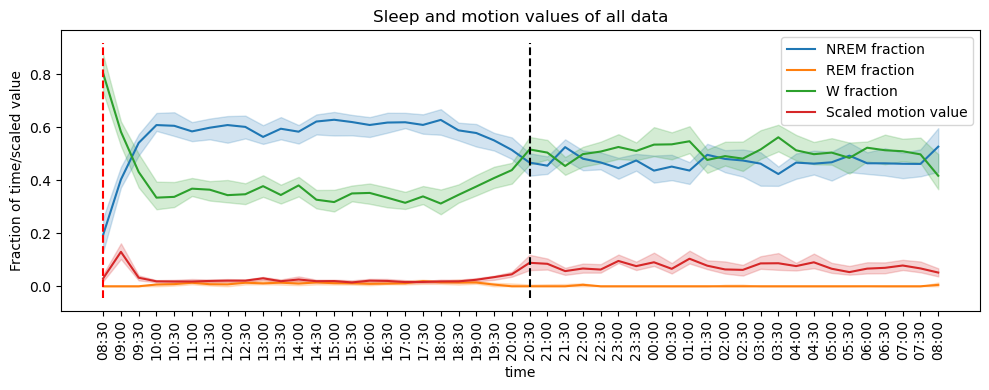

In [32]:
#plot all data - median and 95% confidence interval
#scatter - adds data dots, they just show a huge spread :)
scatter = False
plt.figure(figsize = (10,4))

sns.lineplot(data = out, x = 'time', y = 'nrem_perc', label = 'NREM fraction', estimator='median', errorbar='ci')
sns.lineplot(data = out, x = 'time', y = 'rem_perc', label = 'REM fraction', estimator='median', errorbar='ci')
sns.lineplot(data = out, x = 'time', y = 'w_perc', label = 'W fraction', estimator='median', errorbar='ci')
sns.lineplot(data = out, x = 'time', y = 'sensor', label = 'Scaled motion value', estimator='median', errorbar='ci')

if scatter:
    plt.scatter(out['time'],out['nrem_perc'],c = 'b', alpha = 0.01)
    plt.scatter(out['time'],out['rem_perc'],c = 'y', alpha = 0.01)
    plt.scatter(out['time'],out['w_perc'],c = 'g', alpha = 0.01)
    plt.scatter(out['time'],out['sensor'],c = 'r', alpha = 0.01)
xmin, xmax, ymin, ymax = plt.axis()
plt.vlines(0, ymin, ymax, colors='r', linestyles='--')
plt.vlines(24, ymin, ymax, colors='k', linestyles='--')
plt.xlabel('time')
plt.ylabel('Fraction of time/scaled value')
plt.xticks(rotation=90, ha='center')
plt.legend(loc = 'upper right')
# plt.grid()
plt.title('Sleep and motion values of all data')

plt.tight_layout()
plt.savefig('plots/alldata24h.png', dpi = 300, transparent = True)

plt.show()

In [33]:
#next do comparison between groups
#rats I have for now
out['id'].unique()

array(['10', '11', '12', '13', '14', '16', '21', '23', '24', '25', '26',
       '31', '32', '33', '34', '35', '41', '42', '43', '44', '45', '46',
       '51', '52', '53', '54', '55', '5_', '6_', '7_', '8_'], dtype=object)

In [34]:
#how many rats do I have
len(out['id'].unique())

31

In [35]:
#assign groups - if rat is not here, then in  sal
w_cbn_ids = ['5_','7_','9_','12','14','16'] 
w_sal_ids = ['6_','8_','10','11','13','15']
cbn_ids = ['23','24','31','35','42','46','52']
veh_ids = ['21','26','33','34','43','45','55']

In [36]:
#set group
out['group'] = 'sal'
out['group'].loc[out['id'].isin(w_cbn_ids)] = 'w_cbn'
out['group'].loc[out['id'].isin(w_sal_ids)] = 'w_sal'
out['group'].loc[out['id'].isin(cbn_ids)] = 'cbn'
out['group'].loc[out['id'].isin(veh_ids)] = 'veh'

In [37]:
#now set inj
out['inj']='none'
#mark days where any injections occured, format YYYY-MM-DD (same as index col)
single_inj_dates=pd.to_datetime(['2023-11-18 08:30','2024-01-03 08:30','2023-04-05 08:30','2023-06-07 08:30', '2024-03-04 08:30', '2024-03-21'])
#mark these dates in data
for date in single_inj_dates:
    out['inj'][(out['full_timestamp']>=date)&(out['full_timestamp']<date+pd.DateOffset(hours=24))]='single'

In [38]:
#set cont inj
cont_inj_day1 = pd.to_datetime(['2023-04-09 08:30','2023-05-29 08:30','2023-11-08 08:30','2024-01-08 08:30','2024-02-24 08:30','2024-03-24 08:30'])
cont_inj_day2 = pd.to_datetime(['2023-04-10 08:30','2023-05-30 08:30','2023-11-09 08:30','2024-01-09 08:30','2024-02-25 08:30','2024-03-25 08:30'])
cont_inj_day3 = pd.to_datetime(['2023-04-11 08:30','2023-05-31 08:30','2023-11-10 08:30','2024-01-10 08:30','2024-02-26 08:30','2024-03-26 08:30'])
cont_inj_day4 = pd.to_datetime(['2023-04-12 08:30','2023-06-01 08:30','2023-11-11 08:30','2024-01-11 08:30','2024-02-27 08:30','2024-03-27 08:30'])
cont_inj_day5 = pd.to_datetime(['2023-04-13 08:30','2023-06-02 08:30','2023-11-12 08:30','2024-01-12 08:30','2024-02-28 08:30','2024-03-28 08:30'])
cont_inj_day6 = pd.to_datetime(['2023-11-13 08:30','2024-01-13 08:30','2024-02-29 08:30','2024-03-29 08:30'])
cont_inj_day7 = pd.to_datetime(['2023-11-14 08:30','2024-01-14 08:30','2024-03-01 08:30'])

cont_inj_dates = [cont_inj_day1,cont_inj_day2,cont_inj_day3,cont_inj_day4,cont_inj_day5,cont_inj_day6,cont_inj_day7]

In [39]:
#mark these dates in data
for i, day in enumerate(cont_inj_dates):
    for date in day:
        out['inj'][(out['full_timestamp']>=date)&(out['full_timestamp']<date+pd.DateOffset(hours=24))]=f'cont{i+1}'

In [40]:
#set up a cat dtype for injs
inj_list = ['none','single', 'cont1', 'cont2', 'cont3', 'cont4', 'cont5','cont6', 'cont7', 'sp_sp', 'sp_w']
inj_cat_type = CategoricalDtype(categories=inj_list,ordered=True)
out['inj'] = out['inj'].astype(inj_cat_type)

In [41]:
#set spirulina injs the same way
sp_sp = ['11','13','15','21','24','26','32','34','41','43','45','51','55']
sp_w = ['12','14','23','25','31','33','35','42','44','46','52','53','54']
sp_dates = pd.to_datetime(['2023-06-22 08:30','2023-06-23 08:30','2023-06-24 08:30','2023-06-25 08:30','2023-06-26 08:30','2023-06-27 08:30',
                           '2023-11-30 08:30','2023-12-01 08:30','2023-12-02 08:30','2023-12-03 08:30','2023-12-04 08:30',
                           '2024-01-20 08:30','2024-01-21 08:30','2024-01-22 08:30','2024-01-23 08:30','2024-01-24 08:30','2024-01-25 08:30',
                           '2024-03-10 08:30','2024-03-11 08:30','2024-03-12 08:30','2024-03-13 08:30','2024-03-14 08:30','2024-03-15 08:30',
                           '2024-04-01 08:30','2024-04-02 08:30','2024-04-03 08:30','2024-04-04 08:30','2024-04-05 08:30'                                                                               
                           ])

In [42]:
#mark spirulina experiment dates
for date in sp_dates:
    out['inj'].loc[((out['full_timestamp']>=date)&(out['full_timestamp']<date+pd.DateOffset(hours=24)))&(out['id'].isin(sp_sp))] = 'sp_sp'
    out['inj'].loc[((out['full_timestamp']>=date)&(out['full_timestamp']<date+pd.DateOffset(hours=24)))&(out['id'].isin(sp_w))] = 'sp_w'

In [43]:
#convert out w_perc, nrem_perc, rem_perc to numeric
out['nrem_perc'] = out['nrem_perc'].astype('float').fillna(0)
out['rem_perc'] = out['rem_perc'].astype('float').fillna(0)
out['w_perc'] = out['w_perc'].astype('float').fillna(0)

In [44]:
#split data into three experiments
w_exp = ['w_sal','w_cbn']
sp_exp = ['sp_sp','sp_w']
sp_exp_data = out[out['inj'].isin(sp_exp)].drop('group', axis = 1)
w_exp_data = out[out['group'].isin(w_exp)]
tween_exp_data = out[~out['group'].isin(w_exp)&~(out['inj'].isin(sp_exp))]

In [45]:
#for spirulina round 1, motion sensor data is lost
#therefore the whole round is excluded

In [46]:
#how much data exists in each day/group for the tween experiment
for inj in tween_exp_data['inj'].unique():
    print(inj)
    for group in tween_exp_data['group'].unique():
        print(group+' n =', len(tween_exp_data.loc[(tween_exp_data['inj']==inj)&(tween_exp_data['group']==group), 'id'].unique()))

cont1
veh n = 7
cbn n = 7
sal n = 7
cont2
veh n = 7
cbn n = 7
sal n = 7
cont3
veh n = 7
cbn n = 7
sal n = 7
cont4
veh n = 7
cbn n = 7
sal n = 7
cont5
veh n = 6
cbn n = 6
sal n = 7
cont6
veh n = 6
cbn n = 6
sal n = 7
cont7
veh n = 5
cbn n = 5
sal n = 4
none
veh n = 7
cbn n = 6
sal n = 7
single
veh n = 7
cbn n = 6
sal n = 6


In [136]:
#TWEEN EXP RESULTS
#now for each rat get median where inj != none
med_list = []
for rat in tween_exp_data['id'].unique():
    single_treated = tween_exp_data[(tween_exp_data['id'] == rat) & (tween_exp_data['inj'] != 'none')].groupby('time').median(numeric_only = True)
    single_treated['id'] = rat
    single_treated['group'] = tween_exp_data[tween_exp_data['id'] == rat]['group'].iloc[0]
    med_list.append(single_treated)
meds = pd.concat(med_list)

In [137]:
#how much data is available in total?
n_cbn = len(meds[meds['group']=='cbn']['id'].unique())
n_veh = len(meds[meds['group']=='veh']['id'].unique())
n_sal = len(meds[meds['group']=='sal']['id'].unique())
print(f'cbn group n = {n_cbn}')
print(f'veh group n = {n_veh}')
print(f'sal group n = {n_sal}')

cbn group n = 7
veh group n = 7
sal group n = 7


In [138]:
renaming_dict = {'nrem_perc':'NREM fraction',
                 'rem_perc':'REM fraction',
                 'w_perc':'Wake fraction',
                 'sensor':'Motion duration, fraction of max'}

In [50]:
#outlier rejection function
def reject_outliers(data, thr = 1.5, twosided = True):
    clean = []
    q1 = np.quantile(data, 0.25)
    q3 = np.quantile(data, 0.75)
    iqr = q3-q1
    outlier_n = 0
    for point in data:
        if twosided:
            if point <= q3 + thr*iqr and point >= q1 - thr*iqr:
                clean.append(point)
            else:
                outlier_n +=1
        else:
            if point <= q3 + thr*iqr:
                clean.append(point)
            else:
                outlier_n += 1
    if outlier_n >0:
        print(f'found {outlier_n} outliers')
    
    return clean

In [139]:
#try stats for all params on median data
#for posthoc use Dunns test
#save to txt file
#also add significant hours to param list
signif_params = []

f = open('results/tween_medians_stats.txt','w')
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
for i, param in enumerate(params_to_plot):
    signif_times = []
    for time in meds.index.unique():
        time_subset = meds.loc[time]
        cbn = time_subset[time_subset['group'] == 'cbn'][param].tolist()
        veh = time_subset[time_subset['group'] == 'veh'][param].tolist()
        sal = time_subset[time_subset['group'] == 'sal'][param].tolist()
        
        #remove outliers with 1.5*IQR
        cbn = reject_outliers(cbn)
        veh = reject_outliers(veh)
        sal = reject_outliers(sal)
                
        if cbn and veh and sal:
            if (np.sum(cbn) != np.sum(veh)) and (np.sum(cbn)!=np.sum(sal)):
                stat, p = stats.kruskal(cbn, veh, sal)
                if p < 0.05:
                    print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
                    print(f'hour {time} param {param} significant, p = {p}, stat = {stat}')
                    f.write(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}\n')
                    f.write(f'hour {time} param {param} significant, p = {p}, stat = {stat}\n')
                    dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                    dunn_res.columns = ['cbn','veh','sal']
                    dunn_res.index = ['cbn','veh','sal']
                    if (dunn_res <= 0.05).any().any():
                        #check which groups were different
                        print(dunn_res)                       
                        for p_col in dunn_res.columns:
                            for p_row in dunn_res.index:
                                p = dunn_res.loc[p_row, p_col]
                                if p < 0.05:
                                    signif_times.append([time, p_row, p_col])
                        f.write(dunn_res.to_string())
                    else:
                        print('posthoc ns')
                        f.write('posthoc ns')
                    f.write('\n')
    signif_params.append(signif_times)
f.close()

found 1 outliers
found 1 outliers
n cbn: 6, n veh: 6, n sal: 7
hour 08:30 param nrem_perc significant, p = 0.0003838658592385347, stat = 15.730434782608704
          cbn       veh       sal
cbn  1.000000  1.000000  0.001131
veh  1.000000  1.000000  0.004123
sal  0.001131  0.004123  1.000000
found 1 outliers
n cbn: 7, n veh: 6, n sal: 7
hour 09:00 param nrem_perc significant, p = 0.009548601793960753, stat = 9.302721088435376
          cbn       veh       sal
cbn  1.000000  1.000000  0.009961
veh  1.000000  1.000000  0.098532
sal  0.009961  0.098532  1.000000
found 1 outliers
n cbn: 6, n veh: 7, n sal: 7
hour 09:30 param nrem_perc significant, p = 0.040499624155087094, stat = 6.412925170068021
          cbn       veh       sal
cbn  1.000000  0.034748  0.380773
veh  0.034748  1.000000  0.896367
sal  0.380773  0.896367  1.000000
found 1 outliers
found 1 outliers
n cbn: 7, n veh: 7, n sal: 7
hour 12:00 param nrem_perc significant, p = 0.038612686255793144, stat = 6.508348794063082
        

In [134]:
#letters for plotting
letters = ['A','B','C','D','E','F','G','H']

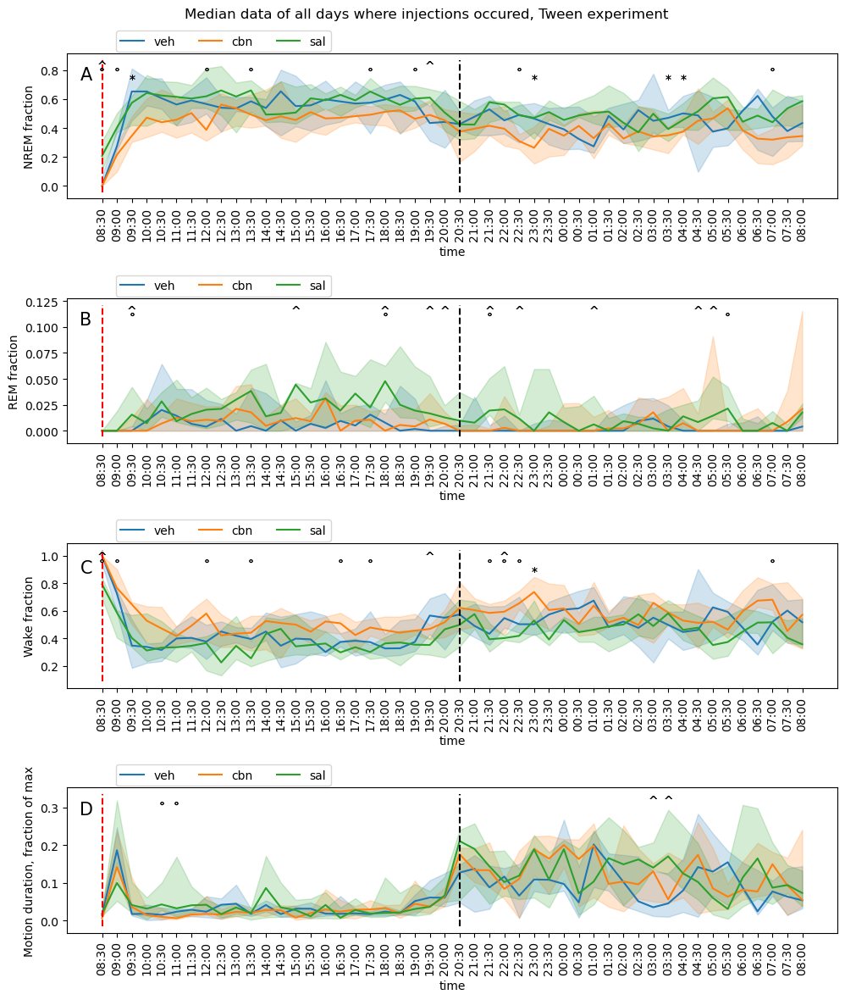

In [140]:
#plot medians
#MARK SIGNIFICANCE
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']#
fig, axs = plt.subplots(4, 1, figsize = (10,12))#4
for i, ax in enumerate(axs):
    sns.lineplot(meds.reset_index(), x = 'time', y = params_to_plot[i], hue = 'group', estimator='median', errorbar='ci', ax = ax)
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    ax.vlines(0, ymin, ymax, colors='r', linestyles='--')
    ax.vlines(24, ymin, ymax, colors='k', linestyles='--')
    
    cbn_veh = []
    cbn_sal = []
    veh_sal = []

    #mark signif as lines
    signif = np.array(signif_params[i], dtype=object)
    for result in signif:
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'veh' or result[1] == 'veh':
                cbn_veh.append(result[0])
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'sal' or result[1] == 'sal':
                cbn_sal.append(result[0])
        if result[1] == 'veh' or result[2] == 'veh':
            if result[2] == 'sal' or result[1] == 'sal':
                veh_sal.append(result[0])
    
    #instead plot as text
    for x in cbn_veh:
        ax.text(x = x, y = ymax*0.85, s = '*', ha="center", va="center")
    for x in cbn_sal:
        ax.text(x = x, y = ymax*0.90, s = '°', ha="center", va="center")
    for x in veh_sal:
        ax.text(x = x, y = ymax*0.95, s = '^', ha="center", va="center")
    
    ax.set(xlabel = 'time', ylabel = renaming_dict[params_to_plot[i]])
    ax.tick_params(labelrotation=90)
    ax.legend(bbox_to_anchor=(0.35, 1.2), ncols = 3)
    plt.setp(ax.get_yticklabels(), rotation=0, horizontalalignment='right')
    ax.annotate(letters[i], xy = (-ax.get_xlim()[1]*0.03, ax.get_ylim()[1]*0.8),  size = 15)

    
# fig.legend()
fig.suptitle('Median data of all days where injections occured, Tween experiment')
plt.tight_layout()
plt.savefig('plots/tween_medians_alldays.png', dpi = 300, transparent = True)
plt.show()

In [141]:
#now I should find the actual values - save them to excel
meds.groupby(['time','group']).agg(['median',q1,q3]).to_excel('results/tween_medians.xlsx')

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\3617042294.py:2: FutureWarning: ['id'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  meds.groupby(['time','group']).agg(['median',q1,q3]).to_excel('results/tween_medians.xlsx')


In [142]:
#do stats on light and dark parts 
#try stats for all params on median data
#for posthoc use Dunns test
#save to txt file
#also add significant hours to param list
signif_params = []

meds['light'] = (meds.index>='08:30')&(meds.index<'20:30')
meds['light'] = meds['light'].replace({True:'Light',False:'Dark'})

byphase = meds.groupby(['id', 'group', 'light']).median(numeric_only = True).reset_index()

f = open('results/tween_lightdark_median_stats.txt','w')
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
for i, param in enumerate(params_to_plot):
    signif_times = []
    for phase in byphase['light'].unique():
        light_subset = byphase.loc[byphase['light'] == phase]
        cbn = light_subset[light_subset['group'] == 'cbn'][param].tolist()
        veh = light_subset[light_subset['group'] == 'veh'][param].tolist()
        sal = light_subset[light_subset['group'] == 'sal'][param].tolist()
        
        cbn = reject_outliers(cbn)
        veh = reject_outliers(veh)
        sal = reject_outliers(sal)
        
        if cbn and veh and sal:
            if (np.sum(cbn) != np.sum(veh)) and (np.sum(cbn)!=np.sum(sal)):
                stat, p = stats.kruskal(cbn, veh, sal)
                if p < 0.05:
                    print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
                    print(f'{phase} phase, param {param} significant, p = {p}, stat = {stat}')
#                     f.write(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}\n')
#                     f.write(f'hour {time} param {param} significant, p = {p}, stat = {stat}\n')
                    dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                    dunn_res.columns = ['cbn','veh','sal']
                    dunn_res.index = ['cbn','veh','sal']
                    if (dunn_res <= 0.05).any().any():
#                         #check which groups were different
                        print(dunn_res)                       
                        for p_col in dunn_res.columns:
                            for p_row in dunn_res.index:
                                p = dunn_res.loc[p_row, p_col]
                                if p < 0.05:
                                    signif_times.append([phase, p_row, p_col])
                        f.write(dunn_res.to_string())
                    else:
                        print('posthoc ns')
                        f.write('posthoc ns')
                    f.write('\n')
    signif_params.append(signif_times)
f.close()

found 1 outliers
n cbn: 6, n veh: 7, n sal: 7
Dark phase, param nrem_perc significant, p = 0.019584963074190484, stat = 7.865986394557822
          cbn       veh       sal
cbn  1.000000  0.189039  0.016788
veh  0.189039  1.000000  1.000000
sal  0.016788  1.000000  1.000000
found 2 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
n cbn: 7, n veh: 6, n sal: 6
Light phase, param w_perc significant, p = 0.009126102714835526, stat = 9.393233082706757
          cbn       veh       sal
cbn  1.000000  0.471610  0.006534
veh  0.471610  1.000000  0.335324
sal  0.006534  0.335324  1.000000


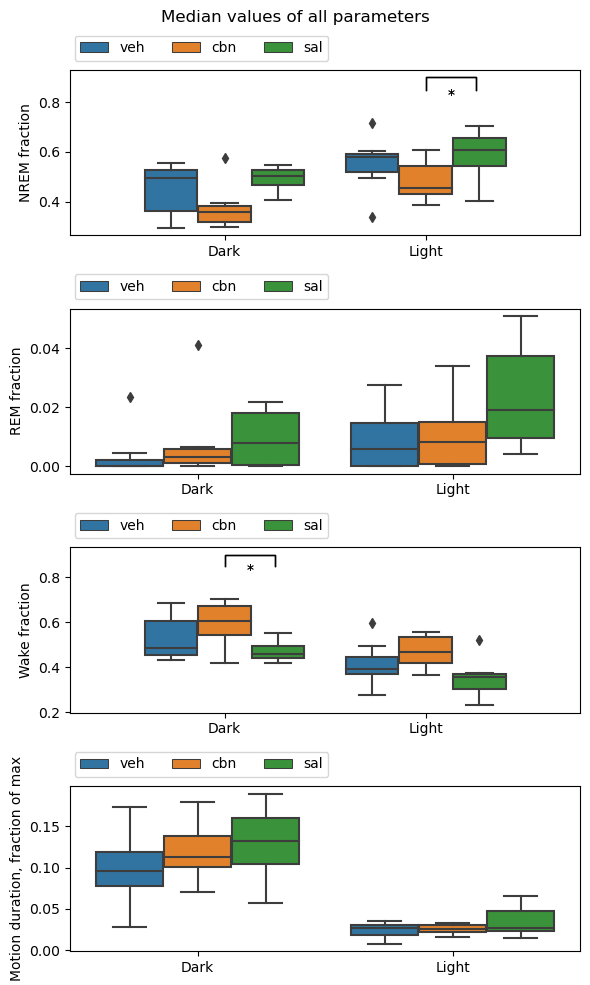

In [175]:
#plot medians, do stats if something seems different
#check stats
fig, axs = plt.subplots(4,1, figsize = (6,10))
for i, ax in enumerate(axs):
    sns.boxplot(data = byphase, x = 'light', y = params_to_plot[i], hue = 'group', ax = ax)
    ax.set(ylabel = renaming_dict[params_to_plot[i]], xlabel = None)
    ax.legend(bbox_to_anchor=(0.52, 1.25), ncols = 3)
    
    cbn_veh = []
    cbn_sal = []
    veh_sal = []

    #mark signif as lines
    signif = np.array(signif_params[i], dtype=object)
    for result in signif:
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'veh' or result[1] == 'veh':
                cbn_veh.append(result[0])
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'sal' or result[1] == 'sal':
                cbn_sal.append(result[0])
        if result[1] == 'veh' or result[2] == 'veh':
            if result[2] == 'sal' or result[1] == 'sal':
                veh_sal.append(result[0])
 
    # #instead plot as text
    offset = 0.25
    for x in cbn_veh:
        if x == 'Light':
            xmin, xmax, y, h = 0-offset, 0, 0.85, 0.05
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        elif x == 'Dark':
            xmin, xmax, y, h = 1-offset, 1, 0.85, 0.05
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
    for x in cbn_sal:
        if x == 'Light':
            xmin, xmax, y, h = 0, 0+offset, 0.85, 0.05
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        elif x == 'Dark':
            xmin, xmax, y, h = 1, 1+offset, 0.85, 0.05
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
    for x in veh_sal:
        if x == 'Light':
            xmin, xmax, y, h = 0-offset, 0+offset, 0.85, 0.05
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        elif x == 'Dark':
            xmin, xmax, y, h = 1-offset, 1+offset, 0.85, 0.05
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
    # ax.text(s = letters[i],x = -0.5, y = ax.get_ylim()[1]*0.8, size = 15)
#3, 
fig.suptitle('Median values of all parameters')
plt.tight_layout()
plt.savefig('plots/tween_median_byphase.png', dpi = 300, transparent = True)
plt.show()

In [177]:
#single injs
single_tween = tween_exp_data[(tween_exp_data['inj']=='single')].dropna()
#single stats
#saving to file
#also add significant hours to param list
signif_params = []
f = open('results/tween_single_inj_stats.txt','w')
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
for param in params_to_plot:
    signif_times = []
    for time in single_tween['time'].unique():
        time_subset = single_tween[single_tween['time'] == time]
        cbn = time_subset[time_subset['group'] == 'cbn'][param].tolist()
        veh = time_subset[time_subset['group'] == 'veh'][param].tolist()
        sal = time_subset[time_subset['group'] == 'sal'][param].tolist()
        
        cbn = reject_outliers(cbn)
        veh = reject_outliers(veh)
        sal = reject_outliers(sal)
        
        #print(f'n for hour {time}, param {param}: cbn {len(cbn)}, veh {len(veh)}, sal {len(sal)}')
        if cbn and veh and sal:
            if (np.sum(cbn) != np.sum(veh)) and (np.sum(cbn)!=np.sum(sal)):
                stat, p = stats.kruskal(cbn, veh, sal)
                if p < 0.05:
                    #also check if any n < 3
                    if len(cbn) < 3 or len(veh) < 3 or len(sal) < 3:
                        continue
                    print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
                    print(f'hour {time} param {param} significant, p = {p}, stat = {stat}')
                    f.write(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}\n')
                    f.write(f'hour {time} param {param} significant, p = {p}, stat = {stat}\n')
                    dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                    dunn_res.columns = ['cbn','veh','sal']
                    dunn_res.index = ['cbn','veh','sal']
                    if (dunn_res <= 0.05).any().any():
                        print(dunn_res)
                        #add to list                    
                        for p_col in dunn_res.columns:
                            for p_row in dunn_res.index:
                                p = dunn_res.loc[p_row, p_col]
                                if p < 0.05:
                                    signif_times.append([time, p_row, p_col])
                        f.write(dunn_res.to_string())
                        f.write('\n')
                    else:
                        print('posthoc ns')
                        f.write('posthoc ns\n')
    signif_params.append(signif_times)
f.close()

found 1 outliers
found 1 outliers
n cbn: 4, n veh: 7, n sal: 4
hour 09:00 param nrem_perc significant, p = 0.014796082086498494, stat = 8.426785714285714
          cbn       veh       sal
cbn  1.000000  0.014028  0.098396
veh  0.014028  1.000000  1.000000
sal  0.098396  1.000000  1.000000
found 1 outliers
found 1 outliers
n cbn: 5, n veh: 7, n sal: 4
hour 10:00 param nrem_perc significant, p = 0.003853307034400913, stat = 11.117647058823536
          cbn       veh       sal
cbn  1.000000  0.012325  1.000000
veh  0.012325  1.000000  0.022028
sal  1.000000  0.022028  1.000000
found 2 outliers
found 1 outliers
n cbn: 4, n veh: 7, n sal: 4
hour 10:30 param nrem_perc significant, p = 0.003345965457471265, stat = 11.400000000000006
          cbn       veh       sal
cbn  1.000000  0.096939  1.000000
veh  0.096939  1.000000  0.003971
sal  1.000000  0.003971  1.000000
found 2 outliers
found 1 outliers
n cbn: 3, n veh: 6, n sal: 3
hour 11:00 param nrem_perc significant, p = 0.023974386905794783,

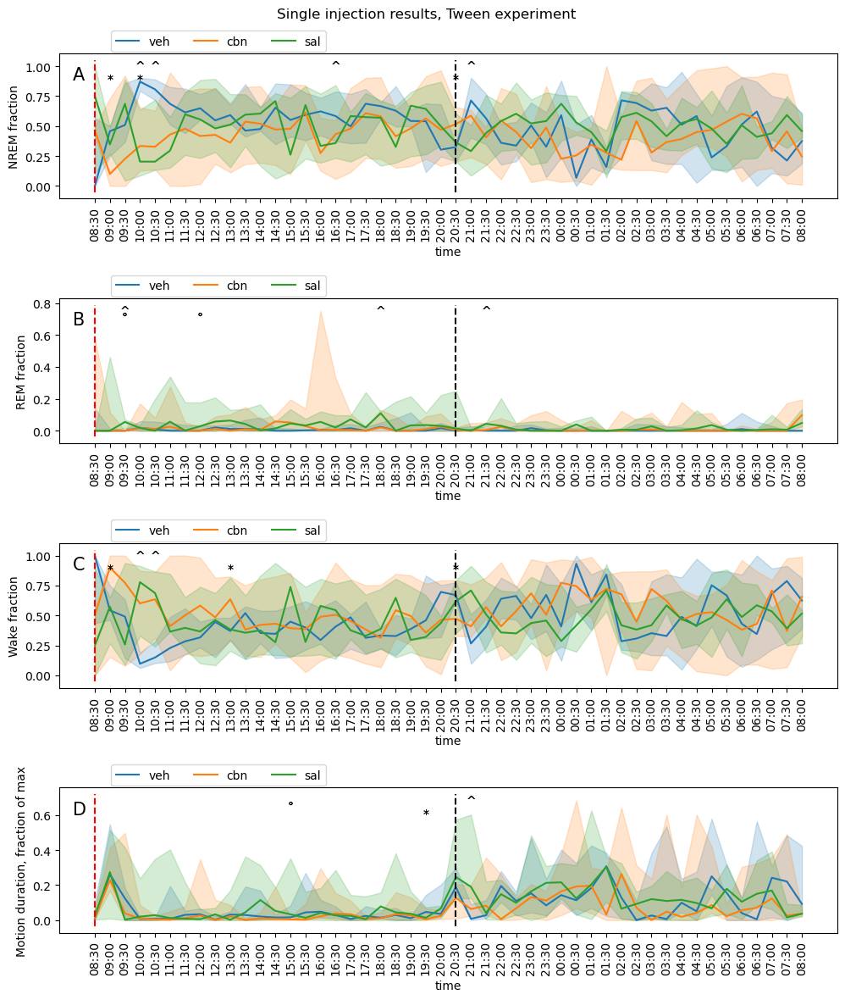

In [178]:
#plot medians
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
fig, axs = plt.subplots(4, 1, figsize = (10,12))
for i, ax in enumerate(axs):
    sns.lineplot(single_tween, x = 'time', y = params_to_plot[i], hue = 'group', estimator='median', errorbar='ci', ax = ax)
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    ax.vlines(0, ymin, ymax, colors='r', linestyles='--')
    ax.vlines(24, ymin, ymax, colors='k', linestyles='--')
    
    cbn_veh = []
    cbn_sal = []
    veh_sal = []

    #mark signif as lines
    signif = np.array(signif_params[i], dtype=object)
    for result in signif:
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'veh' or result[1] == 'veh':
                cbn_veh.append(result[0])
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'sal' or result[1] == 'sal':
                cbn_sal.append(result[0])
        if result[1] == 'veh' or result[2] == 'veh':
            if result[2] == 'sal' or result[1] == 'sal':
                veh_sal.append(result[0])
    
    #instead plot as text
    for x in cbn_veh:
        ax.text(x = x, y = ymax*0.85, s = '*', ha="center", va="center")
    for x in cbn_sal:
        ax.text(x = x, y = ymax*0.90, s = '°', ha="center", va="center")
    for x in veh_sal:
        ax.text(x = x, y = ymax*0.95, s = '^', ha="center", va="center")
    
    ax.set(xlabel = 'time', ylabel = renaming_dict[params_to_plot[i]])
    ax.tick_params(labelrotation=90)
    ax.legend(bbox_to_anchor=(0.35, 1.2), ncols = 3)
    plt.setp(ax.get_yticklabels(), rotation=0, horizontalalignment='right')
    
    ax.annotate(letters[i], xy = (-ax.get_xlim()[1]*0.03, ax.get_ylim()[1]*0.8),  size = 15)

fig.suptitle('Single injection results, Tween experiment')
plt.tight_layout()
plt.savefig('plots/tween_single_injs.png', dpi = 300, transparent = True)
plt.show()

In [58]:
#save to excel
single_tween.drop('full_timestamp', axis = 1).groupby(['time','group']).agg(['median',q1,q3]).to_excel('results/tween_single_res.xlsx')

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\407191087.py:2: FutureWarning: ['id', 'inj'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  single_tween.drop('full_timestamp', axis = 1).groupby(['time','group']).agg(['median',q1,q3]).to_excel('results/tween_single_res.xlsx')


In [60]:

#single inj boxplots
signif_params = []

single_tween['light'] = (single_tween['time']>='08:30')&(single_tween['time']<'20:30')
single_tween['light'] = single_tween['light'].replace({True:'Light',False:'Dark'})

byphase = single_tween.groupby(['id', 'group', 'light']).median(numeric_only = True).reset_index()

f = open('results/tween_lightdark_singleday_stats.txt','w')
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
for i, param in enumerate(params_to_plot):
    signif_times = []
    for phase in byphase['light'].unique():
        light_subset = byphase.loc[byphase['light'] == phase]
        cbn = light_subset[light_subset['group'] == 'cbn'][param].tolist()
        veh = light_subset[light_subset['group'] == 'veh'][param].tolist()
        sal = light_subset[light_subset['group'] == 'sal'][param].tolist()
        
        cbn = reject_outliers(cbn)
        veh = reject_outliers(veh)
        sal = reject_outliers(sal)
        
        if cbn and veh and sal:
            if (np.sum(cbn) != np.sum(veh)) and (np.sum(cbn)!=np.sum(sal)):
                stat, p = stats.kruskal(cbn, veh, sal)
                if p < 0.05:
                    print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
                    print(f'{phase} phase, param {param} significant, p = {p}, stat = {stat}')
#                     f.write(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}\n')
#                     f.write(f'hour {time} param {param} significant, p = {p}, stat = {stat}\n')
                    dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                    dunn_res.columns = ['cbn','veh','sal']
                    dunn_res.index = ['cbn','veh','sal']
                    if (dunn_res <= 0.05).any().any():
#                         #check which groups were different
                        print(dunn_res)                       
                        for p_col in dunn_res.columns:
                            for p_row in dunn_res.index:
                                p = dunn_res.loc[p_row, p_col]
                                if p < 0.05:
                                    signif_times.append([phase, p_row, p_col])
                        f.write(dunn_res.to_string())
                    else:
                        print('posthoc ns')
                        f.write('posthoc ns')
                    f.write('\n')
    signif_params.append(signif_times)
f.close()

found 1 outliers
found 2 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
n cbn: 5, n veh: 6, n sal: 5
Dark phase, param rem_perc significant, p = 0.002277980396845703, stat = 12.168932038834964
          cbn       veh       sal
cbn  1.000000  1.000000  0.022666
veh  1.000000  1.000000  0.002816
sal  0.022666  0.002816  1.000000
found 1 outliers
found 2 outliers
found 1 outliers
found 1 outliers
n cbn: 6, n veh: 6, n sal: 6
Dark phase, param sensor significant, p = 0.038044230030271235, stat = 6.538011695906427
posthoc ns
found 1 outliers


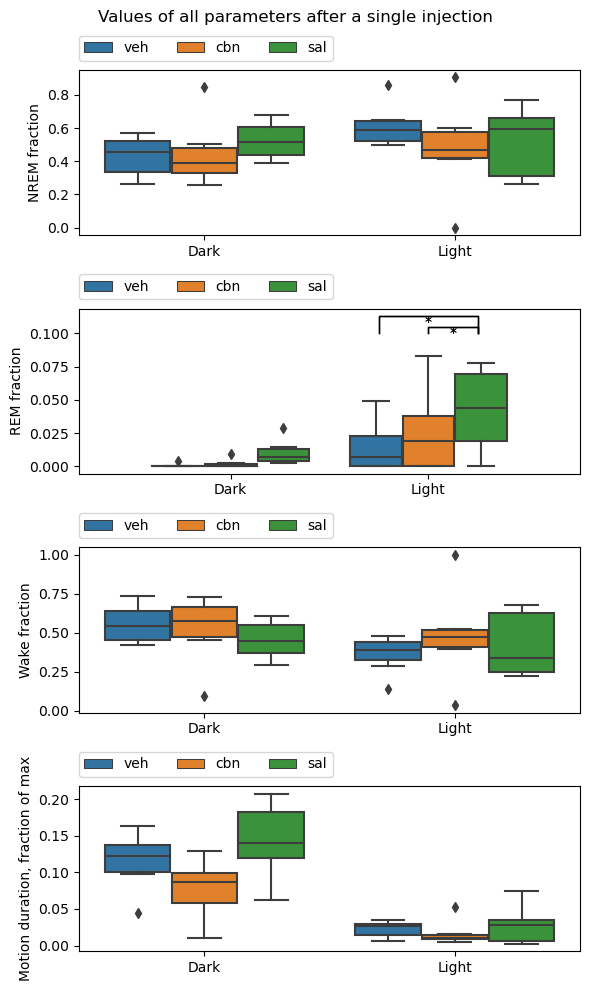

In [61]:
#boxplots
fig, axs = plt.subplots(4,1, figsize = (6,10))
for i, ax in enumerate(axs):
    sns.boxplot(data = byphase, x = 'light', y = params_to_plot[i], hue = 'group', ax = ax)
    ax.set(ylabel = renaming_dict[params_to_plot[i]], xlabel = None)
    ax.legend(bbox_to_anchor=(0.52, 1.25), ncols = 3)
    
    cbn_veh = []
    cbn_sal = []
    veh_sal = []

    #mark signif as lines
    signif = np.array(signif_params[i], dtype=object)
    for result in signif:
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'veh' or result[1] == 'veh':
                cbn_veh.append(result[0])
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'sal' or result[1] == 'sal':
                cbn_sal.append(result[0])
        if result[1] == 'veh' or result[2] == 'veh':
            if result[2] == 'sal' or result[1] == 'sal':
                veh_sal.append(result[0])
 
    # #instead plot as text
    offset = 0.25
    y = 0.1
    h = 0.005
    for x in cbn_veh:
        if x == 'Light':
            xmin, xmax, = 0-offset, 0
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        elif x == 'Dark':
            xmin, xmax = 1-offset, 1
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
    for x in cbn_sal:
        if x == 'Light':
            xmin, xmax = 0, 0+offset
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        elif x == 'Dark':
            xmin, xmax = 1, 1+offset
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
    for x in veh_sal:
        if x == 'Light':
            xmin, xmax = 0-offset, 0+offset
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        elif x == 'Dark':
            xmin, xmax = 1-offset, 1+offset
            ax.plot([xmin, xmin, xmax, xmax], [y, y+0.008+h, y+0.008+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y+0.008-h, "*", ha='center', va='bottom', color='k')
    
fig.suptitle('Values of all parameters after a single injection')
plt.tight_layout()
plt.savefig('plots/tween_singleday_byphase.png', dpi = 300, transparent = True)
plt.show()

In [62]:
#WATER SOLUBLE EXP RESULTS
#water soluble 
med_list = []
for rat in w_exp_data['id'].unique():
    single_treated = w_exp_data[(w_exp_data['id'] == rat) & (w_exp_data['inj'] != 'none')].groupby('time').median(numeric_only = True)
    single_treated['id'] = rat
    single_treated['group'] = w_exp_data[w_exp_data['id'] == rat]['group'].iloc[0]
    med_list.append(single_treated)
w_meds = pd.concat(med_list)

In [63]:
w_meds = w_meds.dropna()

In [64]:
#check how much data is available for wsol exp
#no point in checking cont, only single or medians are relevant
for inj in w_exp_data['inj'].unique():
    print(inj)
    for group in w_exp_data['group'].unique():
        print(group+' n =', len(w_exp_data.loc[(w_exp_data['inj']==inj)&(w_exp_data['group']==group), 'id'].unique()))

single
w_sal n = 4
w_cbn n = 5
none
w_sal n = 3
w_cbn n = 5
cont2
w_sal n = 2
w_cbn n = 2
cont3
w_sal n = 2
w_cbn n = 3
cont4
w_sal n = 2
w_cbn n = 3
cont5
w_sal n = 1
w_cbn n = 2


In [180]:
#w soluble stats
#mann whitney u test
#save to file
#also add to list
f = open('results/w_sol_median_stats.txt', 'w')
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
signif_params = []
for param in params_to_plot:
    signif_times = []
    for time in w_meds.index.unique():
        time_subset = w_meds.loc[time]
        cbn = time_subset[time_subset['group'] == 'w_cbn'][param].tolist()
        sal = time_subset[time_subset['group'] == 'w_sal'][param].tolist()
        
        cbn = reject_outliers(cbn)
        # veh = reject_outliers(veh)
        sal = reject_outliers(sal)
        
        # print(f'n for hour {time}, param {param}: cbn {len(cbn)}, sal {len(sal)}')
        if cbn and sal:
            stat, p = stats.mannwhitneyu(cbn, sal)
            if p < 0.05:
                print(f'n cbn: {len(cbn)}, n sal: {len(sal)}')
                print(f'hour {time} param {param} significant, p = {p}, stat = {stat}')
                f.write(f'n cbn: {len(cbn)}, n sal: {len(sal)}\n')
                f.write(f'hour {time} param {param} significant, p = {p}, stat = {stat}\n')
                signif_times.append(time)
    signif_params.append(signif_times)
f.close()

found 2 outliers
found 1 outliers
found 1 outliers
found 1 outliers
n cbn: 4, n sal: 4
hour 02:00 param nrem_perc significant, p = 0.02857142857142857, stat = 16.0
found 1 outliers
found 2 outliers
found 1 outliers
n cbn: 3, n sal: 5
hour 04:00 param nrem_perc significant, p = 0.03571428571428571, stat = 15.0
found 2 outliers
found 1 outliers
found 2 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 2 outliers
found 1 outliers
found 1 outliers
found 2 outliers
n cbn: 5, n sal: 4
hour 19:30 param nrem_perc significant, p = 0.015873015873015872, stat = 20.0
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outlie

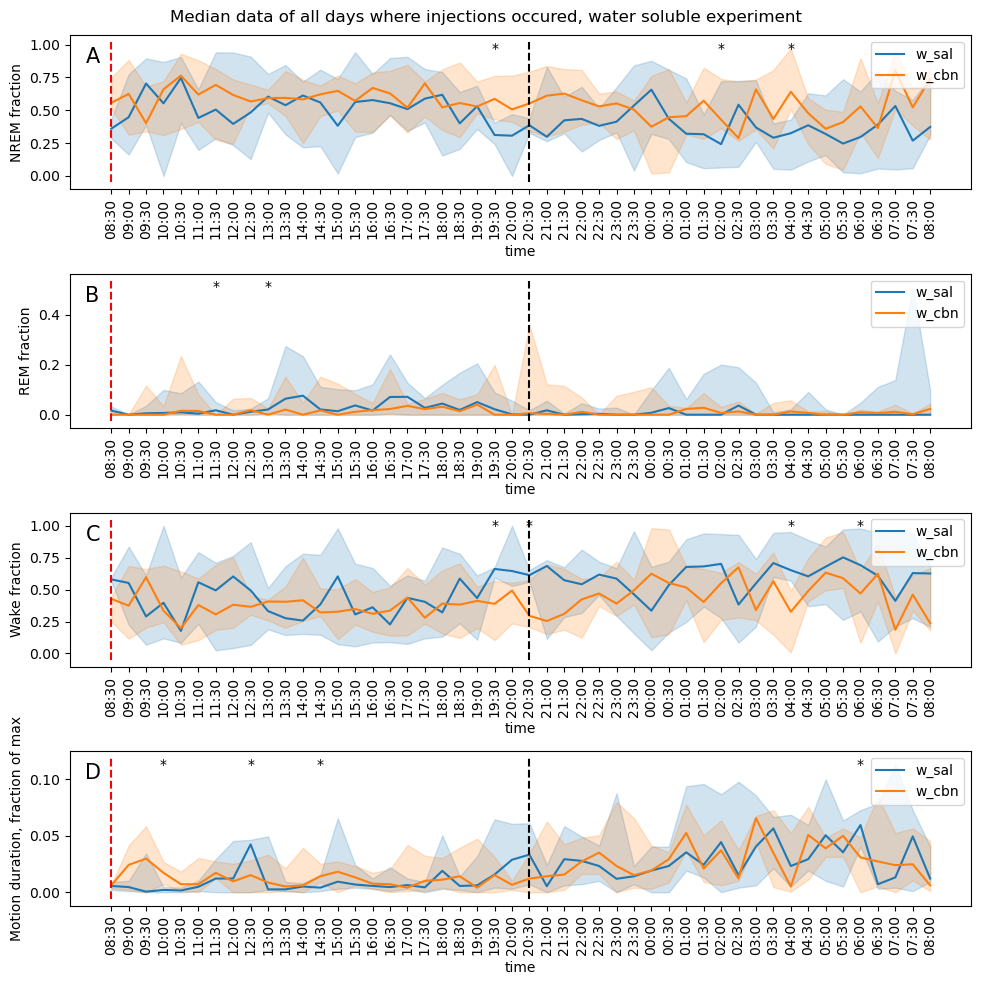

In [181]:
#plot water soluble medians
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
fig, axs = plt.subplots(4, 1, figsize = (10,10))
for i, ax in enumerate(axs):
    sns.lineplot(w_meds.reset_index(), x = 'time', y = params_to_plot[i], hue = 'group', estimator='median', errorbar='ci', ax = ax)
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    ax.vlines(0, ymin, ymax, colors='r', linestyles='--')
    ax.vlines(24, ymin, ymax, colors='k', linestyles='--')
    for x in signif_params[i]:
        ax.text(x = x, y = ymax*0.95, s = '*', ha="center", va="center")
    
    ax.set(xlabel = 'time', ylabel = renaming_dict[params_to_plot[i]])
    ax.tick_params(labelrotation=90)
    ax.legend(loc = 'upper right')
    plt.setp(ax.get_yticklabels(), rotation=0, horizontalalignment='right')#, fontsize='x-small')
    ax.annotate(letters[i], xy = (-ax.get_xlim()[1]*0.03, ax.get_ylim()[1]*0.8),  size = 15)

fig.suptitle('Median data of all days where injections occured, water soluble experiment')

plt.tight_layout()
plt.savefig('plots/w_sol_median_of_all_inj_results.png', dpi = 300, transparent = True)
plt.show()

In [67]:
#save to excel
w_meds.groupby(['time','group']).agg(['median',q1,q3]).to_excel('results/w_sol_medians.xlsx')

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\3872394961.py:2: FutureWarning: ['id'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  w_meds.groupby(['time','group']).agg(['median',q1,q3]).to_excel('results/w_sol_medians.xlsx')


In [68]:

#do stats on light and dark parts 
signif_params = []

w_meds['light'] = (w_meds.index>='08:30')&(w_meds.index<'20:30')
w_meds['light'] = w_meds['light'].replace({True:'Light',False:'Dark'})

byphase = w_meds.groupby(['id', 'group', 'light']).median(numeric_only = True).reset_index()

f = open('results/wsol_lightdark_median_stats.txt','w')
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
for i, param in enumerate(params_to_plot):
    signif_times = []
    for phase in byphase['light'].unique():
        light_subset = byphase.loc[byphase['light'] == phase]
        cbn = light_subset[light_subset['group'] == 'w_cbn'][param].tolist()
        sal = light_subset[light_subset['group'] == 'w_sal'][param].tolist()
        
        cbn = reject_outliers(cbn)
        # veh = reject_outliers(veh)
        sal = reject_outliers(sal)
        
        if cbn and sal:
            if (np.sum(cbn)!=np.sum(sal)):
                stat, p = stats.mannwhitneyu(cbn, sal)
                if p < 0.05:
                    print(f'n cbn: {len(cbn)}, n sal: {len(sal)}')
                    print(f'{phase} phase, param {param} significant, p = {p}, stat = {stat}')
                    f.write(f'n cbn: {len(cbn)}, n sal: {len(sal)}\n')
                    f.write(f'{phase} phase, param {param} significant, p = {p}, stat = {stat}\n')
                    f.write('\n')
                    signif_times.append([phase])
    signif_params.append(signif_times)
f.close()

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
n cbn: 5, n sal: 4
Dark phase, param w_perc significant, p = 0.031746031746031744, stat = 1.0
found 1 outliers
n cbn: 4, n sal: 4
Light phase, param sensor significant, p = 0.029401048190339642, stat = 16.0


['Dark']
['Light']


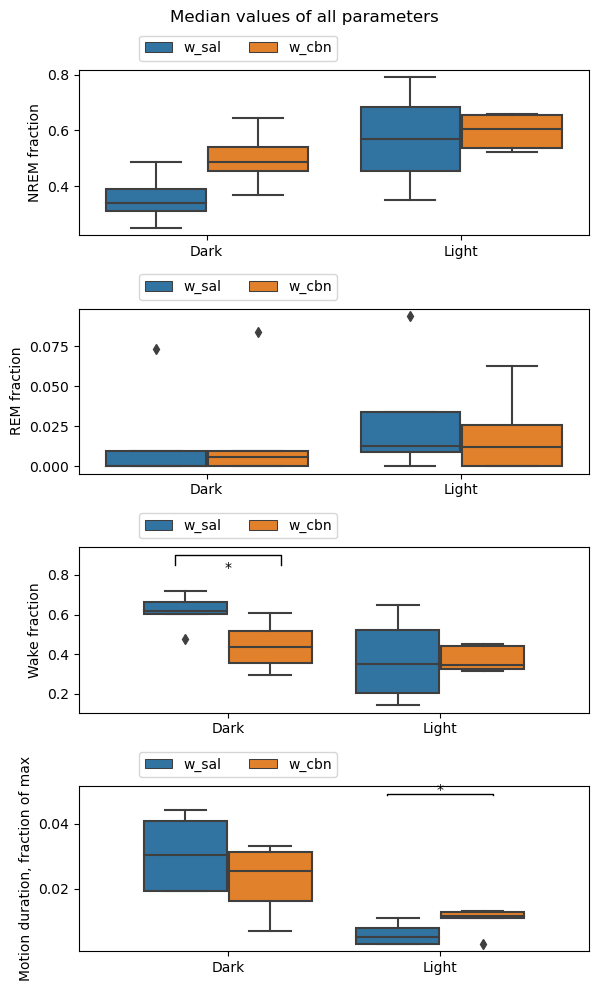

In [69]:
#boxplots
#medians
fig, axs = plt.subplots(4,1, figsize = (6,10))
for i, ax in enumerate(axs):
    sns.boxplot(data = byphase, x = 'light', y = params_to_plot[i], hue = 'group', ax = ax)
    ax.set(ylabel = renaming_dict[params_to_plot[i]], xlabel = None)
    ax.legend(bbox_to_anchor=(0.52, 1.25), ncols = 3)
    
    cbn_veh = []
    cbn_sal = []
    veh_sal = []
    #mark signif as lines

    signif = np.array(signif_params[i], dtype=object)
    # #instead plot as text
    offset = 0.25
    y = byphase[params_to_plot[i]].max()*1.1
    h = 0.0005
    
    for x in signif:
        print(x)
        if x[0] == 'Light':
            xmin, xmax = 1-offset, 1+offset
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        elif x[0] == 'Dark':
            xmin, xmax, y, h = 0-offset, 0+offset, 0.85, 0.05
            ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
            ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')

    
fig.suptitle('Median values of all parameters')
plt.tight_layout()
plt.savefig('plots/wsol_median_byphase.png', dpi = 300, transparent = True)
plt.show()

In [70]:
#save to excel
byphase.groupby(['light','group']).agg(['median',q1,q3]).to_excel('results/wsol_medians_byphase.xlsx')

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\1682581945.py:2: FutureWarning: ['id'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  byphase.groupby(['light','group']).agg(['median',q1,q3]).to_excel('results/wsol_medians_byphase.xlsx')


In [75]:
#TWEEN EXP CONT RESULTS
#generate full df of 7 days - double check if everything is ok

cont_list = []
for id in tween_exp_data['id'].unique():
    # print(id)
    rat = tween_exp_data.loc[(tween_exp_data['id']==id)]
    gr = rat['group'].iloc[0]
    rat = rat.groupby(['inj','time']).median(numeric_only = True).reset_index()#.loc[rat['inj'].str.contains('cont')].iloc[:,:]#.to_numpy()[:,0])
    rat = rat[rat['inj'].str.contains('cont')]
    # print(rat.isna().sum())
    rat['group'] = gr
    rat['id'] = id
    rat['time_adj'] = rat['time'].astype(str)+rat['inj'].astype(str)
    cont_list.append(rat)
cont_res = pd.concat(cont_list)

In [76]:
#set up a cat dtype for injs
cont_res_list = cont_res['time_adj'].unique().tolist()
cont_cat_type = CategoricalDtype(categories=cont_res_list,ordered=True)
cont_res['time_adj'] = cont_res['time_adj'].astype(cont_cat_type)

In [77]:

#single injs
single_tween = tween_exp_data[(tween_exp_data['inj']=='single')].dropna()
#single stats
#saving to file
#also add significant hours to param list
f = open('results/tween_single_inj_stats.txt','w')
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
for param in params_to_plot:
    signif_times = []
    for time in single_tween['time'].unique():
        time_subset = single_tween[single_tween['time'] == time]
        cbn = time_subset[time_subset['group'] == 'cbn'][param].tolist()
        veh = time_subset[time_subset['group'] == 'veh'][param].tolist()
        sal = time_subset[time_subset['group'] == 'sal'][param].tolist()
        
        cbn = reject_outliers(cbn)
        veh = reject_outliers(veh)
        sal = reject_outliers(sal)
        
        #print(f'n for hour {time}, param {param}: cbn {len(cbn)}, veh {len(veh)}, sal {len(sal)}')
        if cbn and veh and sal:
            if (np.sum(cbn) != np.sum(veh)) and (np.sum(cbn)!=np.sum(sal)):
                stat, p = stats.kruskal(cbn, veh, sal)
                if p < 0.05:
                    #also check if any n < 3
                    if len(cbn) < 3 or len(veh) < 3 or len(sal) < 3:
                        continue
                    print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
                    print(f'hour {time} param {param} significant, p = {p}, stat = {stat}')
                    f.write(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}\n')
                    f.write(f'hour {time} param {param} significant, p = {p}, stat = {stat}\n')
                    dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                    dunn_res.columns = ['cbn','veh','sal']
                    dunn_res.index = ['cbn','veh','sal']
                    if (dunn_res <= 0.05).any().any():
                        print(dunn_res)
                        #add to list                    
                        for p_col in dunn_res.columns:
                            for p_row in dunn_res.index:
                                p = dunn_res.loc[p_row, p_col]
                                if p < 0.05:
                                    signif_times.append([time, p_row, p_col])
                        f.write(dunn_res.to_string())
                        f.write('\n')
                    else:
                        print('posthoc ns')
                        f.write('posthoc ns\n')
    signif_params.append(signif_times)
f.close()

found 1 outliers
found 1 outliers
n cbn: 4, n veh: 7, n sal: 4
hour 09:00 param nrem_perc significant, p = 0.014796082086498494, stat = 8.426785714285714
          cbn       veh       sal
cbn  1.000000  0.014028  0.098396
veh  0.014028  1.000000  1.000000
sal  0.098396  1.000000  1.000000
found 1 outliers
found 1 outliers
n cbn: 5, n veh: 7, n sal: 4
hour 10:00 param nrem_perc significant, p = 0.003853307034400913, stat = 11.117647058823536
          cbn       veh       sal
cbn  1.000000  0.012325  1.000000
veh  0.012325  1.000000  0.022028
sal  1.000000  0.022028  1.000000
found 2 outliers
found 1 outliers
n cbn: 4, n veh: 7, n sal: 4
hour 10:30 param nrem_perc significant, p = 0.003345965457471265, stat = 11.400000000000006
          cbn       veh       sal
cbn  1.000000  0.096939  1.000000
veh  0.096939  1.000000  0.003971
sal  1.000000  0.003971  1.000000
found 2 outliers
found 1 outliers
n cbn: 3, n veh: 6, n sal: 3
hour 11:00 param nrem_perc significant, p = 0.023974386905794783,

In [78]:

#ok now let's do funny stuff - stats for every half-hour in the week :)
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
#save to file
f = open('results/tween_7day_stats.txt','w')
signif_params = []
for time in cont_res['time_adj'].unique():
    to_plot = cont_res.loc[(cont_res['time_adj']==time)].groupby(['id','group']).median(numeric_only=True).reset_index().dropna()
    for param in params_to_plot:
        cbn = to_plot[(to_plot['group']=='cbn')][param]
        veh = to_plot[(to_plot['group']=='veh')][param]
        sal = to_plot[(to_plot['group']=='sal')][param]
        
        cbn = reject_outliers(cbn)
        veh = reject_outliers(veh)
        sal = reject_outliers(sal)
        
        if np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh) and np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh):
            stat, p = stats.kruskal(cbn, veh, sal)
            if p < 0.05:
                print(f'kruskal of {param} significant')
                print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')         
                f.write(f'kruskal of {param} significant\n')
                f.write(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}\n')       
                dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                dunn_res.columns = ['cbn','veh','sal']
                dunn_res.index = ['cbn','veh','sal']
                if (dunn_res <= 0.05).any().any():
                    print(f'time {time}, param {param} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant')   
                    print(dunn_res)
                    print('\n')
                    f.write(f'time {time}, param {param} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant\n')
                    f.write(dunn_res.to_string())
                    f.write('\n')
                    #add to list                    
                    for p_col in dunn_res.columns:
                        for p_row in dunn_res.index:
                            p = dunn_res.loc[p_row, p_col]
                            if p < 0.05:
                                signif_params.append([param, time, p_row, p_col])
                    
                else:
                    print('posthoc ns')
                    f.write('posthoc ns\n')
f.close()

found 1 outliers
kruskal of nrem_perc significant
n cbn: 5, n veh: 3, n sal: 4
time 09:00cont1, param nrem_perc 
p = 0.016111771449691555, stat = 8.256410256410255
Dunn posthoc Bonferroni corr significant
          cbn       veh       sal
cbn  1.000000  0.034039  0.068903
veh  0.034039  1.000000  1.000000
sal  0.068903  1.000000  1.000000


found 1 outliers
found 1 outliers
kruskal of w_perc significant
n cbn: 5, n veh: 3, n sal: 4
time 09:00cont1, param w_perc 
p = 0.0161117714496915, stat = 8.256410256410263
Dunn posthoc Bonferroni corr significant
          cbn       veh       sal
cbn  1.000000  0.034039  0.068903
veh  0.034039  1.000000  1.000000
sal  0.068903  1.000000  1.000000


found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
kruskal of nrem_perc significant
n cbn: 6, n veh: 4, n sal: 6
time 11:00cont1, param nrem_perc 
p = 0.0128689071376312

<Figure size 1500x300 with 0 Axes>

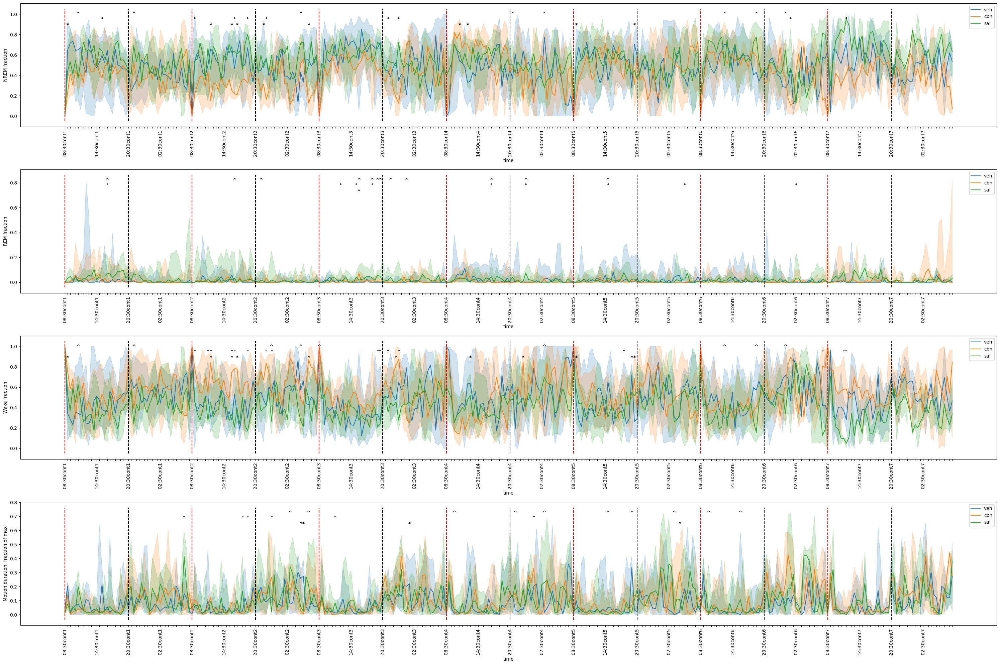

In [79]:
#check what it looks like - 1 min to run
plt.figure(figsize=(15,3))
fig, axs = plt.subplots(4, 1, figsize = (30,20))
signif_array = np.array(signif_params)
for i, ax in enumerate(axs):
    sns.lineplot(data = cont_res.reset_index(), x = 'time_adj', y = params_to_plot[i], hue = 'group', estimator='median', errorbar='ci', ax = ax)
    ax.set(xlabel='time', ylabel=renaming_dict[params_to_plot[i]])
    ax.legend(loc = 'upper right')
    for index, label in enumerate(ax.xaxis.get_ticklabels()):
        if index % 12 != 0:
            label.set_visible(False)
    ax.tick_params(axis = 'x', labelrotation=90)
    ymin, ymax = ax.get_ylim()
    ax.vlines([i*24 for i in range(0,14,2)], ymin, ymax, color = 'r', linestyles='--')
    ax.vlines([i*24 for i in range(1,14,2)], ymin, ymax, color = 'k', linestyles='--')
    
    
    cbn_veh = []
    cbn_sal = []
    veh_sal = []

    #mark signif as lines
    signif = signif_array[signif_array[:,0]==params_to_plot[i]][:,1:]
    for result in signif:
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'veh' or result[1] == 'veh':
                cbn_veh.append(result[0])
        if result[1] == 'cbn' or result[2] == 'cbn':
            if result[2] == 'sal' or result[1] == 'sal':
                cbn_sal.append(result[0])
        if result[1] == 'veh' or result[2] == 'veh':
            if result[2] == 'sal' or result[1] == 'sal':
                veh_sal.append(result[0])
    
    #instead plot as text
    for x in cbn_veh:
        ax.text(x = x, y = ymax*0.85, s = '*', ha="center", va="center")
    for x in cbn_sal:
        ax.text(x = x, y = ymax*0.90, s = '°', ha="center", va="center")
    for x in veh_sal:
        ax.text(x = x, y = ymax*0.95, s = '^', ha="center", va="center")
    

plt.tight_layout()
plt.savefig('plots/tween_7day_rec.png', dpi = 300, transparent = True)
plt.show()

In [80]:
#save this to excel
cont_res.dropna().groupby(['time_adj','group']).agg(['median',q1,q3]).to_excel('results/tween_7day_res.xlsx')

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\699888174.py:2: FutureWarning: ['inj', 'time', 'id'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  cont_res.dropna().groupby(['time_adj','group']).agg(['median',q1,q3]).to_excel('results/tween_7day_res.xlsx')


In [81]:
#get results of every day/night
injs = ['single', 'cont1','cont2','cont3','cont4','cont5','cont6','cont7']
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']

cont_res.loc[(cont_res['time']>='08:30')&(cont_res['time']<'20:30'), 'light'] = 'Light'
cont_res.loc[~((cont_res['time']>='08:30')&(cont_res['time']<'20:30')), 'light'] = 'Dark'
#save to file
f = open('results/tween_7days_stats_byphase.txt','w')
#save to list
signif_times = []

for i in range(len(injs)):
    to_plot = cont_res.loc[(cont_res['inj']==injs[i])].groupby(['id','group','light']).median(numeric_only=True).reset_index().dropna()
        #run stats for light
    for param in params_to_plot:
        for phase in to_plot['light'].unique():
            cbn = to_plot[(to_plot['group']=='cbn')&(to_plot['light']==phase)][param]
            veh = to_plot[(to_plot['group']=='veh')&(to_plot['light']==phase)][param]
            sal = to_plot[(to_plot['group']=='sal')&(to_plot['light']==phase)][param]

            cbn = reject_outliers(cbn)
            veh = reject_outliers(veh)
            sal = reject_outliers(sal)
        
            if np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh) and np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh):
                stat, p = stats.kruskal(cbn, veh, sal)
                if p < 0.05:
                    print(f'kruskal of {param} significant in {phase} phase in {injs[i]}')
                    print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
                    f.write(f'kruskal of {param} significant in the light\n')
                    f.write(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}\n')
                    dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                    dunn_res.columns = ['cbn','veh','sal']
                    dunn_res.index = ['cbn','veh','sal']
                    if (dunn_res <= 0.05).any().any():
                        print(f'day {injs[i]}, phase {phase}, param {param} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant')   
                        print(dunn_res)
                        print('\n')
                        f.write(f'day {injs[i]}, phase {phase}, param {param} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant\n')
                        f.write(dunn_res.to_string())
                        f.write('\n')
                        #add to list                    
                        for p_col in dunn_res.columns:
                            for p_row in dunn_res.index:
                                p = dunn_res.loc[p_row, p_col]
                                if p < 0.05:
                                    signif_times.append([param, injs[i], phase, p_row, p_col])
                    else:
                        print('posthoc ns') 
                        f.write('posthoc ns\n')
f.close()

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
kruskal of rem_perc significant in Light phase in cont1
n cbn: 5, n veh: 5, n sal: 7
day cont1, phase Light, param rem_perc 
p = 0.017955638036493676, stat = 8.039702233250617
Dunn posthoc Bonferroni corr significant
          cbn       veh       sal
cbn  1.000000  1.000000  0.157263
veh  1.000000  1.000000  0.021545
sal  0.157263  0.021545  1.000000


found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 2 outliers
kruskal of nrem_perc significant in Dark phase in cont2
n cbn: 7, n veh: 7, n sal: 7
day cont2, phase Dark, param nrem_perc 
p = 0.018937620669469017, stat = 7.933209647495374
Dunn posthoc Bonferroni corr significant
          cbn       veh      sal
cbn  1.000000  0.104425  0.02272
veh  0.104425  1.000000  1.00000
sal  0.022720  1.000000  1.00000


found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 2 outliers
kruskal of w_perc significant in Dark p

In [82]:
#save to excel
cont_res.dropna().groupby(['inj','group','light']).agg(['median',q1,q3]).dropna().to_excel('results/tween_byphase_res_7d.xlsx')

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\3981270497.py:2: FutureWarning: ['time', 'id', 'time_adj'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  cont_res.dropna().groupby(['inj','group','light']).agg(['median',q1,q3]).dropna().to_excel('results/tween_byphase_res_7d.xlsx')


In [83]:
renaming_dict3 = {'nrem_perc':'NREM, fraction', 'rem_perc':'REM, fraction', 'w_perc':'Wake, fraction', 'sensor':'Motion, fraction of max'}
day_renaming_dict = {'cont1':'Day 1','cont2':'Day 2','cont3':'Day 3','cont4':'Day 4','cont5':'Day 5','cont6':'Day 6','cont7':'Day 7'}

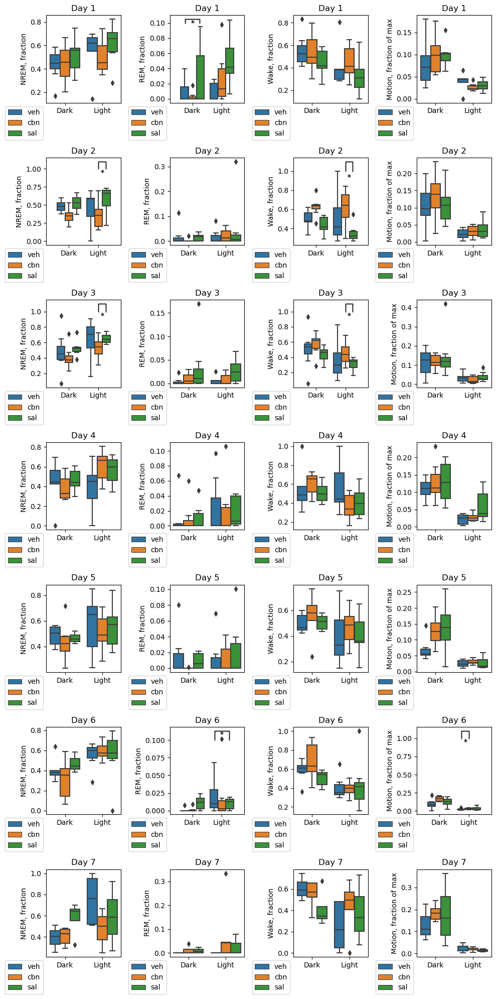

In [84]:
#do boxplots
fig, ax =  plt.subplots(7,4, figsize = (10,20))
for i1, inj in enumerate(injs[1:]):
    for i, param in enumerate(params_to_plot):
        to_plot = cont_res.loc[(cont_res['inj']==inj)].groupby(['id','group','light']).median(numeric_only=True).reset_index().dropna()
        sns.boxplot(data = to_plot, x = 'light', y = param, hue = 'group', ax = ax[i1][i])
        ax[i1][i].legend(bbox_to_anchor = (0,0))#, ncols = 3)#[],[], frameon=False)
        ax[i1][i].set(ylabel = renaming_dict3[param], xlabel = None, title = day_renaming_dict[inj])
        
        #mark stats 
        cbn_veh = []
        cbn_sal = []
        veh_sal = []

        #mark signif
        signif = np.array(signif_times)
        signif = signif[[inj in str(row) for row in signif[:,1]]]
        #get param subset
        signif_param = signif[signif[:,0] == param]
        for result in signif_param:
            if result[3] == 'cbn' or result[4] == 'cbn':
                if result[4] == 'veh' or result[3] == 'veh':
                    cbn_veh.append(result[2])
            if result[3] == 'cbn' or result[4] == 'cbn':
                if result[4] == 'sal' or result[3] == 'sal':
                    cbn_sal.append(result[2])
            if result[3] == 'veh' or result[4] == 'veh':
                if result[4] == 'sal' or result[3] == 'sal':
                    veh_sal.append(result[2])
        
        # #instead plot as text
        offset = 0.25
        if param == 'rem_perc':
            y = 0.1
            h = 0.005
        else:
            y = 1
            h = 0.1
        for x in cbn_veh:
            if x == 'Light':
                xmin, xmax, = 0-offset, 0
                ax[i1][i].plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
                ax[i1][i].text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
            elif x == 'Dark':
                xmin, xmax = 1-offset, 1
                ax[i1][i].plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
                ax[i1][i].text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        for x in cbn_sal:
            if x == 'Light':
                xmin, xmax = 0, 0+offset
                ax[i1][i].plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
                ax[i1][i].text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
            elif x == 'Dark':
                xmin, xmax = 1, 1+offset
                ax[i1][i].plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
                ax[i1][i].text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
        for x in veh_sal:
            if x == 'Light':
                xmin, xmax = 0-offset, 0+offset
                ax[i1][i].plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
                ax[i1][i].text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
            elif x == 'Dark':
                xmin, xmax = 1-offset, 1+offset
                ax[i1][i].plot([xmin, xmin, xmax, xmax], [y, y+0.008+h, y+0.008+h, y], linewidth=1, c='k')
                ax[i1][i].text((xmin+xmax)*.5, y+0.008-h, "*", ha='center', va='bottom', color='k')
        
        
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
# fig.legend(by_label.values(), by_label.keys())
plt.tight_layout()
plt.savefig('plots/tween_7day_byphase.png', dpi = 300, transparent = True)
plt.show()

In [85]:
#get periodograms of each rat
meds = cont_res.groupby(['id','time_adj']).median(numeric_only = True).reset_index()
meds = meds.dropna()
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']

rat_list = []
for id in meds['id'].unique():
    param_list = []
    for param in params_to_plot:
        rat = meds[meds['id'] == id].drop('id', axis = 1)
        param_f, param_pxx = signal.periodogram(rat[param], fs=1/1800)
        param_series = pd.Series(param_pxx, index = param_f, name = param)
        param_list.append(param_series)
    rat = pd.DataFrame(param_list).T
    rat['id'] = id
    rat['group'] = cont_res[cont_res['id']==id]['group'].iloc[0]
    rat['freq_events_hour'] = param_series.index.to_numpy()*60*60
    #good to have, but messes up the x axis when plotting
    # rat['event_period_h'] = 1/rat['freq_events_hour']#np.ones(len(rat['freq_events_hour']))
    # rat['event_period_h'] = rat['event_period_h'].replace([np.inf, -np.inf], rat[np.isfinite(rat['event_period_h'])]['event_period_h'].max()*2)
    rat_list.append(rat)
fourier = pd.concat(rat_list)

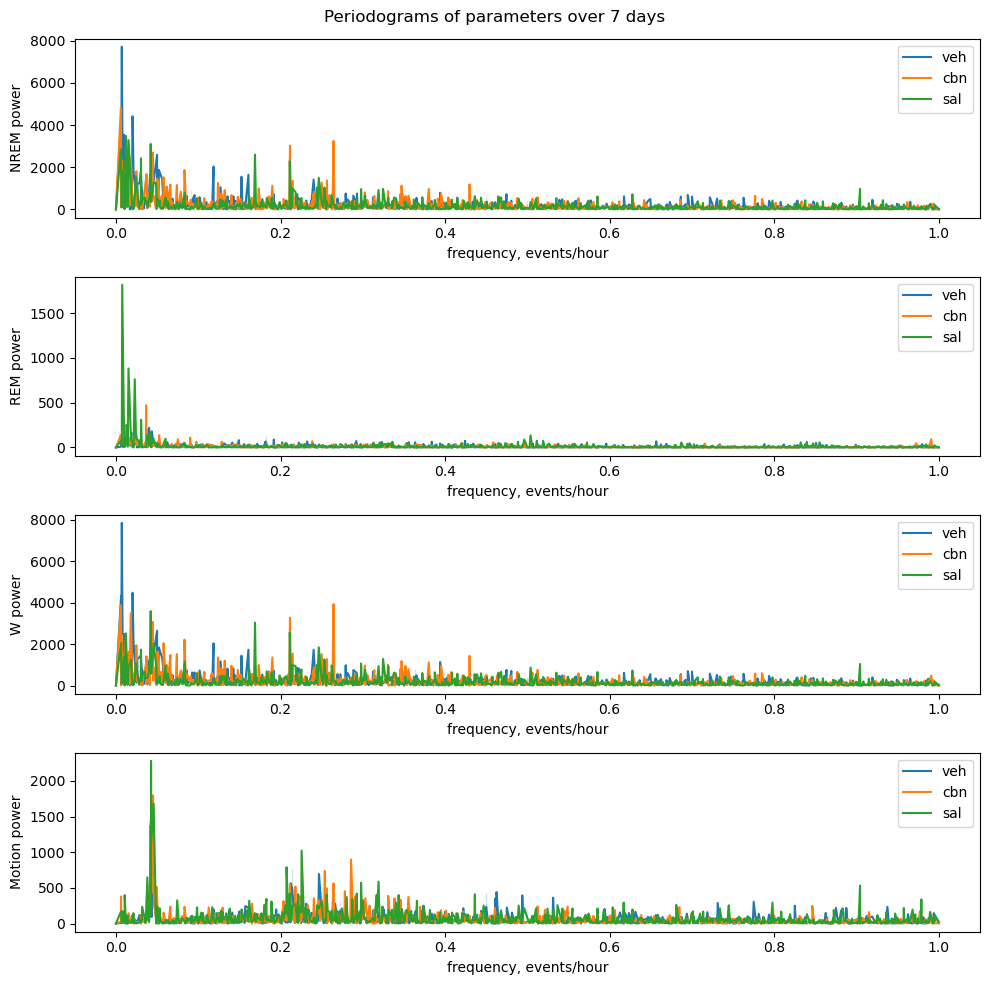

In [86]:
#...and plot it! 
renaming_dict2 = {
    'nrem_perc':'NREM',
    'rem_perc':'REM',
    'w_perc':'W',
    'sensor':'Motion'
}
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
fig, axs = plt.subplots(4,figsize=(10,10))
for i, ax in enumerate(axs):
    sns.lineplot(data = fourier.dropna(), x = 'freq_events_hour', y = params_to_plot[i], hue = 'group', estimator = 'median', errorbar='ci', ax = ax)
    ax.set(xlabel = 'frequency, events/hour', ylabel = renaming_dict2[params_to_plot[i]]+' power')
    ax.legend(loc = 'upper right')
fig.suptitle('Periodograms of parameters over 7 days')
plt.tight_layout()
plt.savefig('plots/tween_periodogram_by_group.png', dpi = 300, transparent = True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


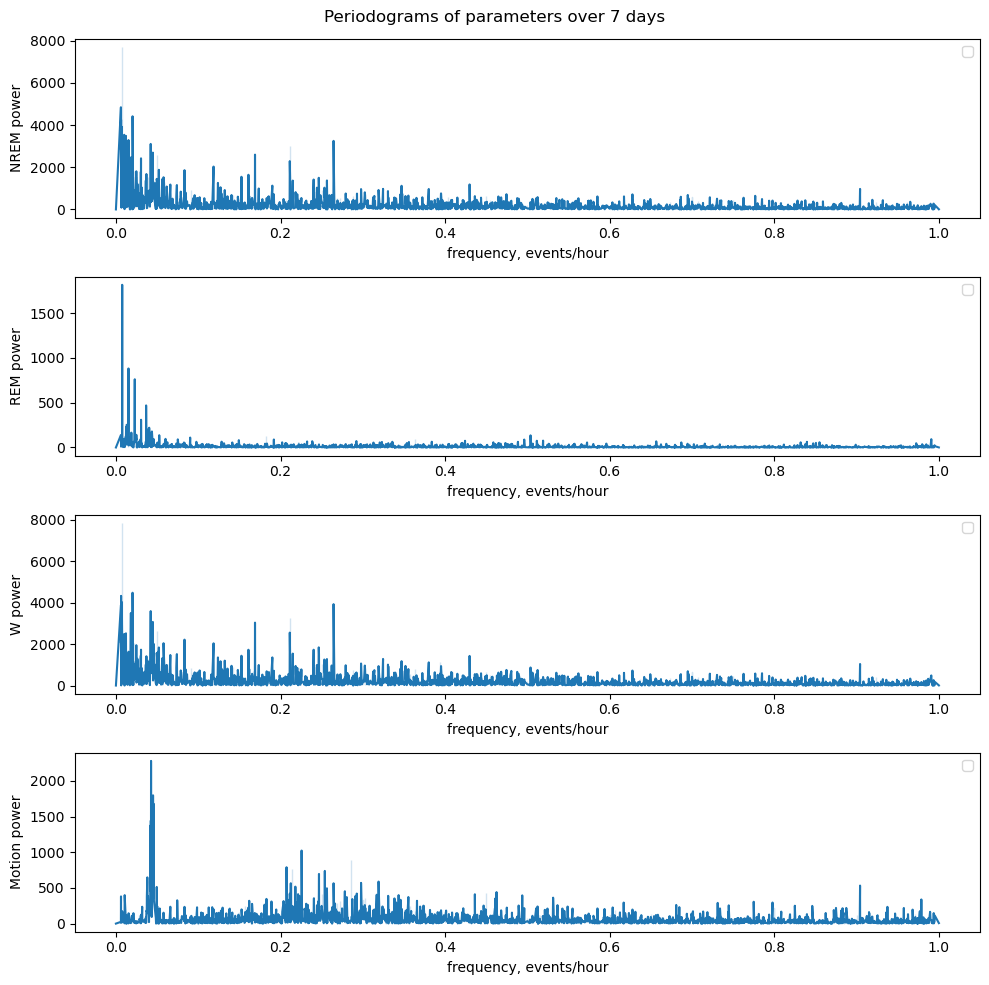

In [87]:
#plot without splitting to groups
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
fig, axs = plt.subplots(4,figsize=(10,10))
for i, ax in enumerate(axs):
    sns.lineplot(data = fourier.dropna(), x = 'freq_events_hour', y = params_to_plot[i], estimator = 'median', errorbar='ci', ax = ax)
    ax.set(xlabel = 'frequency, events/hour', ylabel = renaming_dict2[params_to_plot[i]]+' power')
    ax.legend(loc = 'upper right')
fig.suptitle('Periodograms of parameters over 7 days')
plt.tight_layout()
plt.savefig('plots/tween_periodogram_overall.png', dpi = 300, transparent = True)
plt.show()

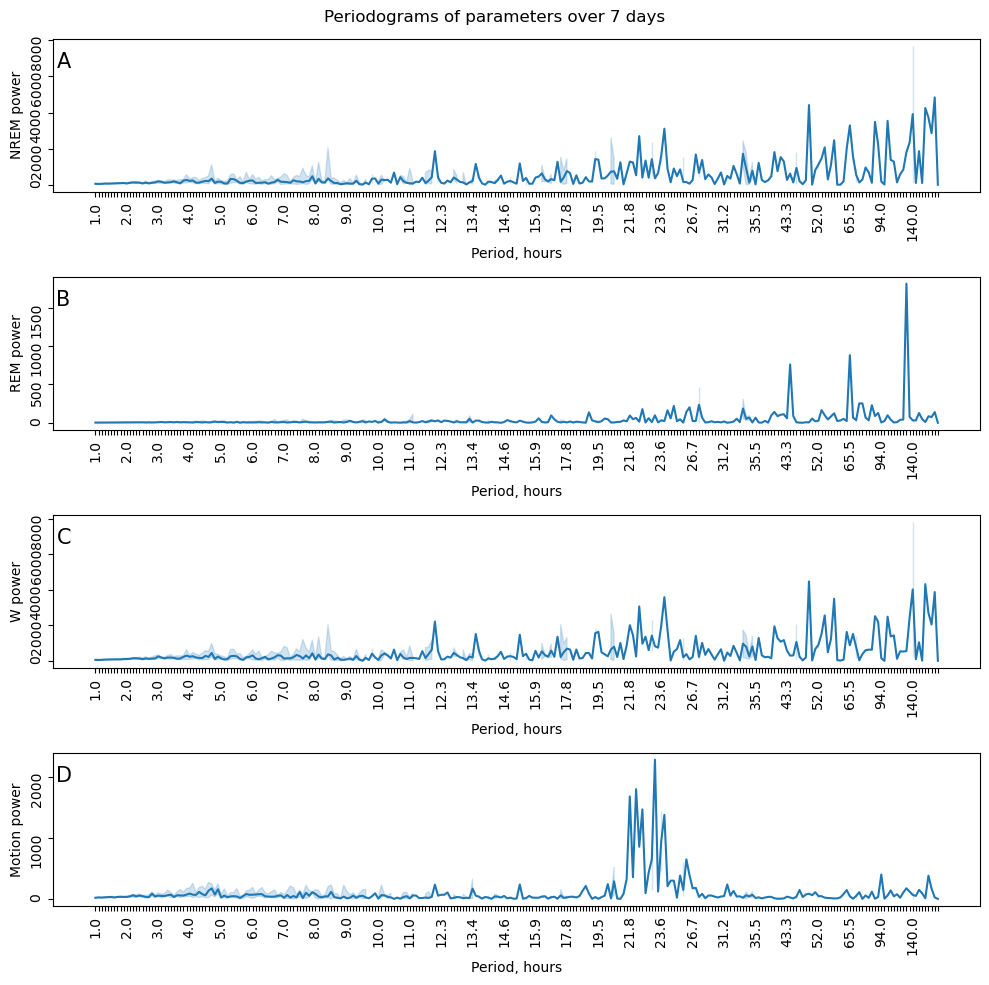

In [88]:
#BINNING BY HOUR, CONVERT FREQ TO EVENTS/HOUR
from matplotlib.ticker import ScalarFormatter
#slowish - 1 min
#plot without splitting to groups
fourier['period_hours'] = (1/fourier['freq_events_hour']).round(1).astype('str')#conv to str not okay due to messed up grouping later
period_dtype = CategoricalDtype(categories=(1/fourier['freq_events_hour']).sort_values().round(1).astype('str').unique(),ordered=True)
fourier['period_hours'] = fourier['period_hours'].astype(period_dtype)
letters = ['A', 'B', 'C', 'D', 'E']
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
fig, axs = plt.subplots(4,figsize=(10,10))
for i, ax in enumerate(axs):
    sns.lineplot(data = fourier.dropna().reset_index(), x = 'period_hours', y = params_to_plot[i], estimator = 'median', errorbar='ci', ax = ax)
    ax.set(xlabel = 'Period, hours', ylabel = renaming_dict2[params_to_plot[i]]+' power')
    ax.tick_params(labelrotation=90)
    #add peaks
    d = fourier.groupby('period_hours').median(numeric_only = True)[params_to_plot[i]].reset_index().dropna()
    peaks = np.argsort(d[params_to_plot[i]].to_numpy())[::-1][:50]

    #turn off unnecessary ticks
    n = 10
    for index, label in enumerate(ax.xaxis.get_ticklabels()):
        if index % n != 0:
            label.set_visible(False)
    ax.annotate(letters[i], xy = (ax.get_xlim()[0]+1, ax.get_ylim()[1]*0.8),  size = 15)

    
fig.suptitle('Periodograms of parameters over 7 days')
plt.tight_layout()
plt.savefig('plots/tween_periodogram_overall_period_nopeaks.png', dpi = 300, transparent = True)
plt.show()

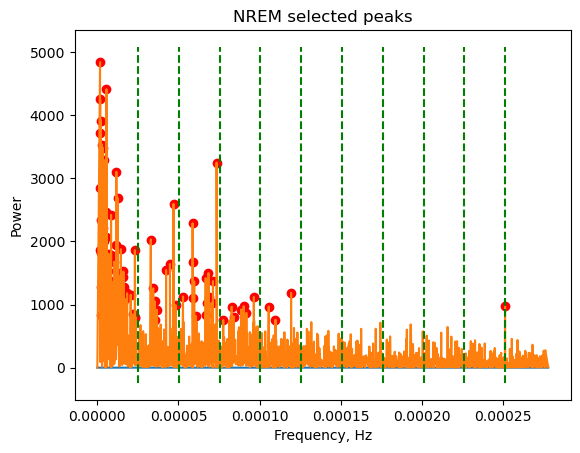

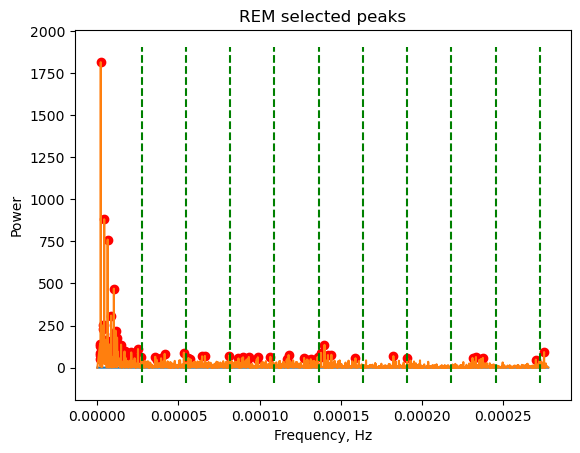

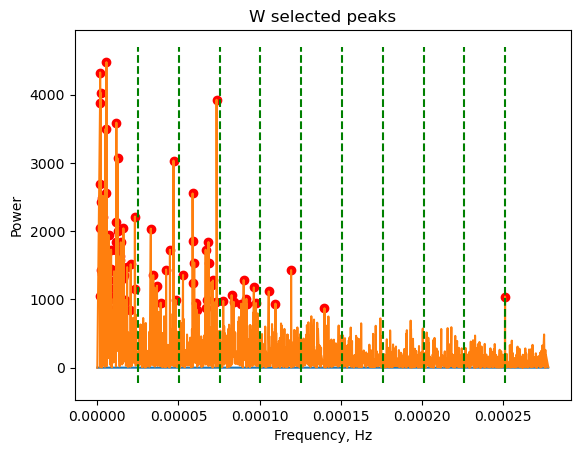

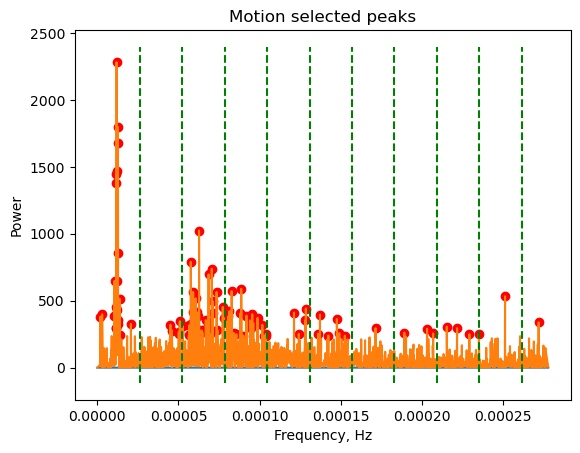

In [92]:
#select relevant components by selecting peaks
subs_by_param = []
for param in params_to_plot:
    d = fourier.groupby(fourier.index).median(numeric_only = True)[param].reset_index().dropna()
    peaks = np.argsort(d[param].to_numpy())[::-1][:100]
    peak_freqs = d.iloc[peaks]['index'].to_numpy()
    sr = 1/1800
    #generate subsets
    sel_freqs = []
    for i, freq in enumerate(peak_freqs):
        #get the mean of non-different freqs
        freq = np.mean(peak_freqs[(peak_freqs<=freq*1.1)&(peak_freqs>=freq*0.9)])
        sel_freqs.append(freq)
    sel_freqs = np.unique(sel_freqs)
    bins = np.arange(0.1, 1.1, 0.1)*np.max(sel_freqs)
    inds = np.digitize(sel_freqs, bins, right=True)
    f = pd.DataFrame(sel_freqs, inds)
    #this is the mean freq
    sel_freqs = f.groupby(f.index).mean().to_numpy()
    #should instead add ranges from min to max
    subs = f.groupby(f.index).agg(['min', 'mean','max']).to_numpy()
    # subs = np.array([[x*0.9, x, x*1.1] for x in sel_freqs if (x*1.1<=sr/2)])
    subs = np.array([x for x in subs if (x[2]<=sr/2)])
    
    subs_by_param.append(subs)
    #add visualization
    plt.plot(d['index'],d)
    plt.scatter(d.iloc[peaks]['index'],d.iloc[peaks][param], c = 'r')
    xmin, xmax, ymin, ymax = plt.axis()
    plt.vlines(bins, ymin, ymax, linestyles='--', colors='g')
    plt.title(renaming_dict2[param]+' selected peaks')
    plt.xlabel('Frequency, Hz')
    plt.ylabel('Power')
    plt.savefig(f'plots/periodogram_peak_selection_{param}.png')
    plt.show()

In [93]:
#plot comps by param
#get multiple comps
for_slow_comp = cont_res.groupby(['id','group','time_adj']).median().reset_index()
for_slow_comp.index = for_slow_comp['time_adj']
for_slow_comp = for_slow_comp.dropna()

comps = []
for id in for_slow_comp['id'].unique():   
    for i, param in enumerate(params_to_plot):
        param_data = for_slow_comp.loc[(for_slow_comp['id']==id), param]
        param_comps = []
        if len(param_data)>123:
            for comp_n in range(len(subs_by_param[i])):
                # slow_comps = [] 
                fstop = subs_by_param[i][comp_n][2]
                fstart = subs_by_param[i][comp_n][0]
                freq = (float(subs_by_param[i][comp_n][1])*60*60)
                
                if freq == fstart or freq == fstop or fstart == fstop:
                    fstop = freq * 1.1
                    fstart = freq * 0.9                
                if fstop > sr/2:
                    continue
                
                period = 1/freq
                period_adj = str(np.round(period,2)).replace('.','_')
                sos_bandpass=signal.butter(N=20, Wn=(fstart, fstop), btype='bp', output='sos',  fs=sr)
                param_comp = pd.Series(signal.sosfiltfilt(sos_bandpass, param_data), index = param_data.index, name= f'comp_{period_adj}')
                param_comps.append(param_comp)
        param_df = pd.DataFrame(param_comps).T
        param_df['param'] = param
        param_df['id'] = id
        param_df['group'] = for_slow_comp.loc[for_slow_comp['id']==id, 'group'].iloc[0]
        comps.append(param_df)
comps = pd.concat(comps)

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\1122866362.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  for_slow_comp = cont_res.groupby(['id','group','time_adj']).median().reset_index()


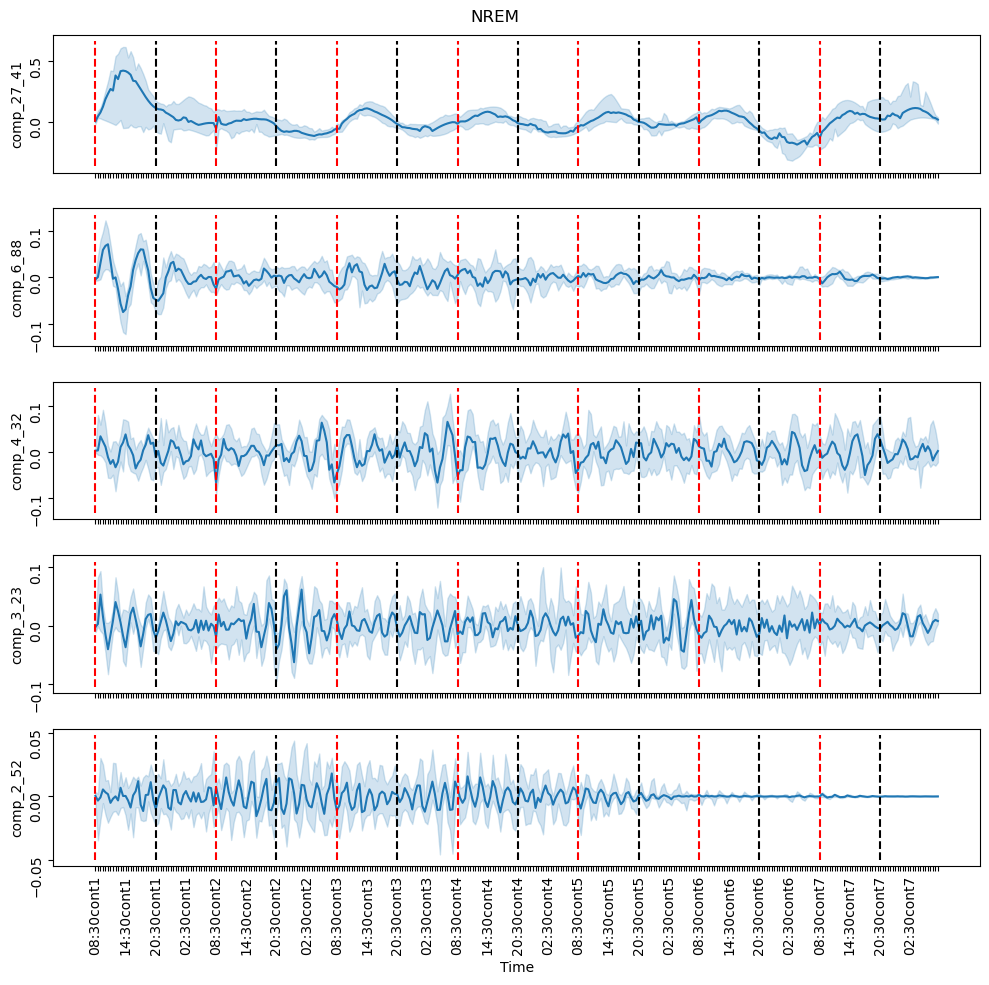

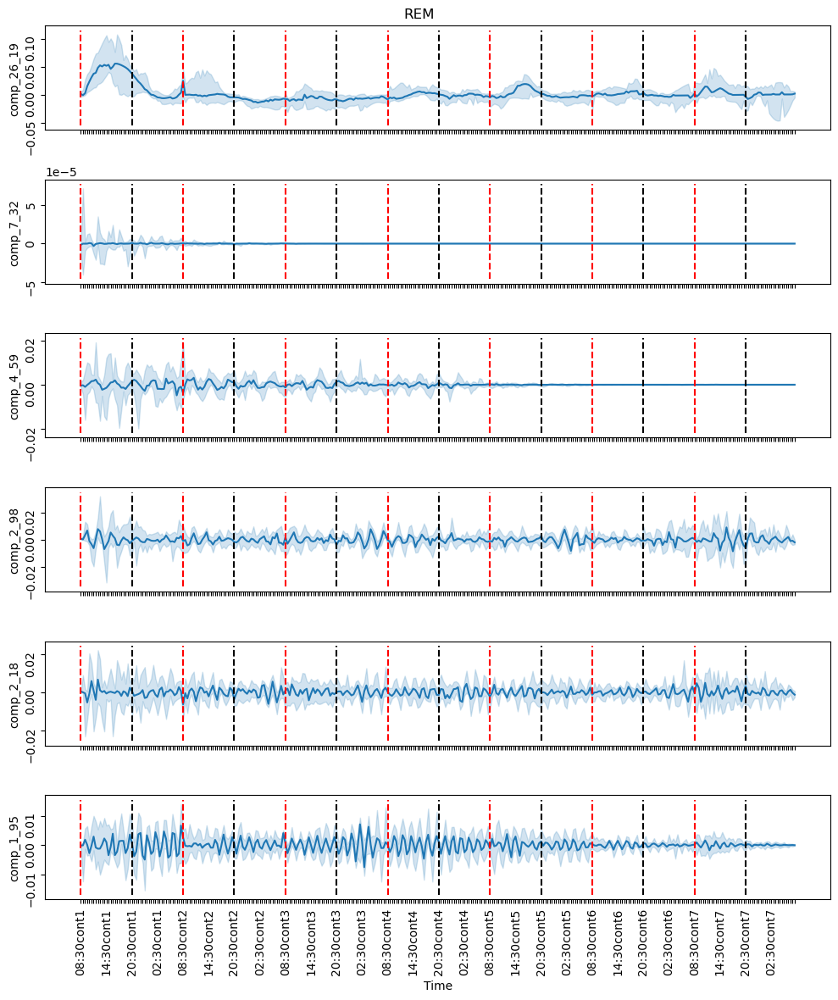

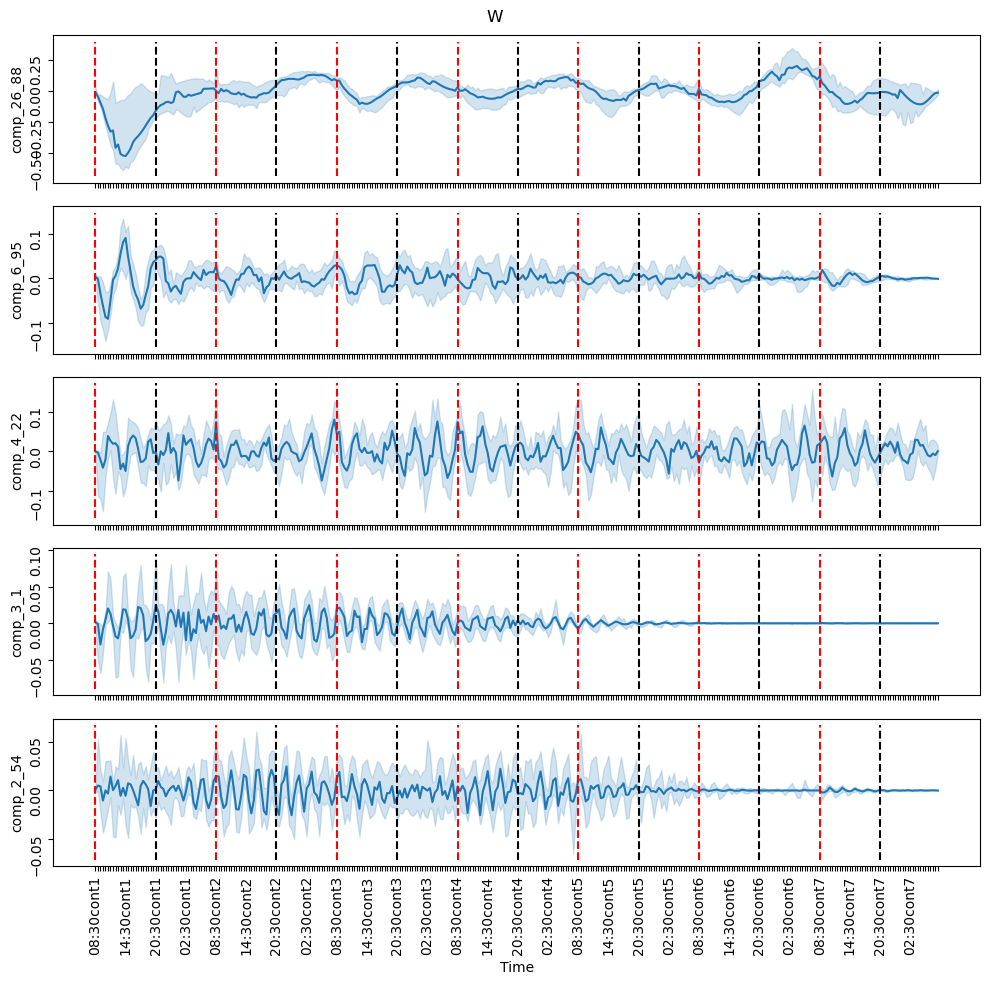

comp_1_62 not in comps, continuing


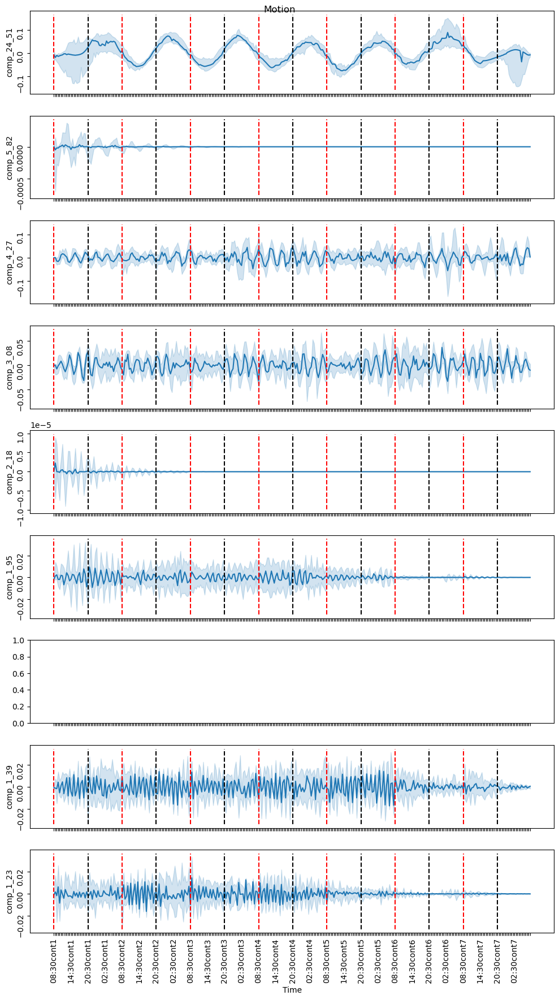

In [94]:
#extracted components (slow, 6min)
for ip, param in enumerate(params_to_plot):
    param_data = comps.loc[comps['param']==param].reset_index().dropna(axis=1)
    fig, axs = plt.subplots(len(param_data.columns[:-4]),1,figsize = (10, len(param_data.columns[:-4])*2), sharex=True)
    for i, ax in enumerate(axs):
        period = 1/(float(subs_by_param[ip][i][1])*60*60)
        period_adj = str(np.round(period,2)).replace('.','_')
        
        #check if component exists
        if f'comp_{period_adj}' not in param_data.columns:
            print(f'comp_{period_adj} not in comps, continuing')
            continue
        
        sns.lineplot(data = param_data, x = 'index', y = f'comp_{period_adj}', estimator='median', errorbar='ci', ax=ax)
        ax.tick_params(labelrotation=90)
        n = 12
        for index, label in enumerate(ax.xaxis.get_ticklabels()):
            if index % n != 0:
                label.set_visible(False)
        ax.set(xlabel = 'Time')
        ymin, ymax = ax.get_ylim()
        ax.vlines([i*24 for i in range(0,14,2)], ymin, ymax, color = 'r', linestyles='--')
        ax.vlines([i*24 for i in range(1,14,2)], ymin, ymax, color = 'k', linestyles='--')
        # ax.legend(loc = 'center right')
    fig.suptitle(renaming_dict2[param])
    plt.tight_layout()
    plt.savefig(f'plots/extracted_comps_overall_{param}.png')
    plt.show()

In [95]:
param_data.columns.drop(['index','param','id','group'])[0].strip('comp_')

'2_18'

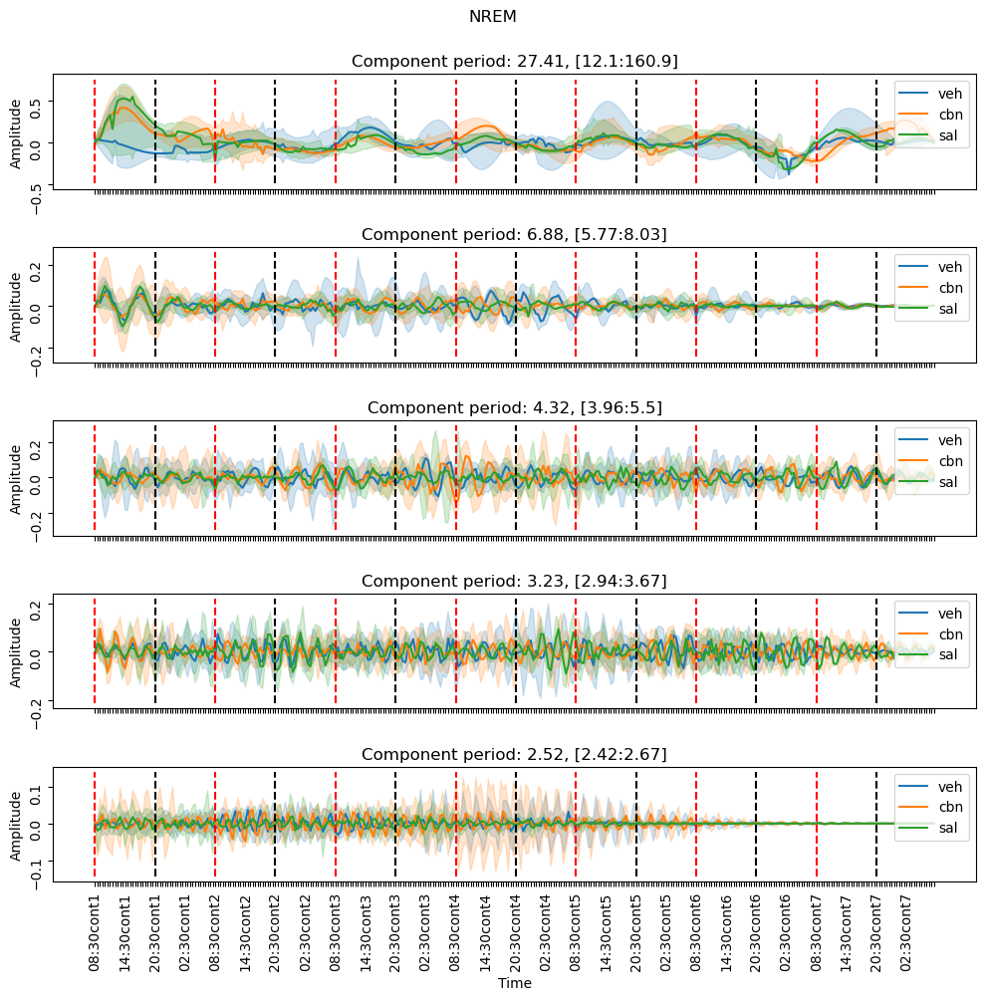

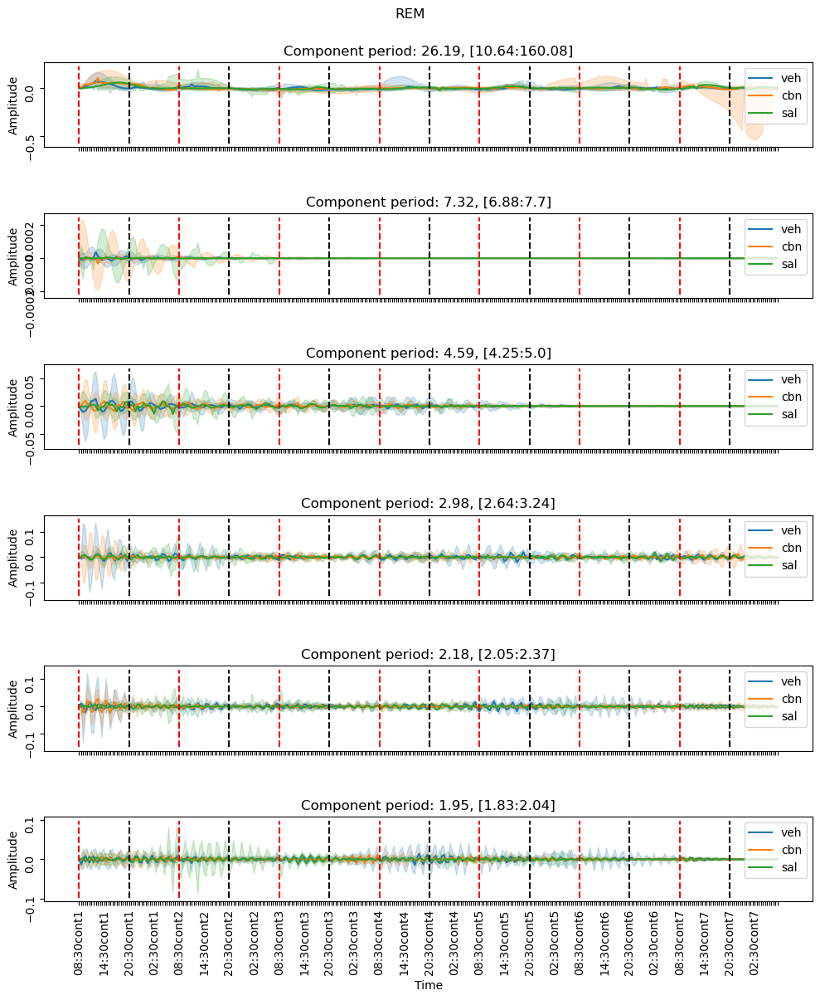

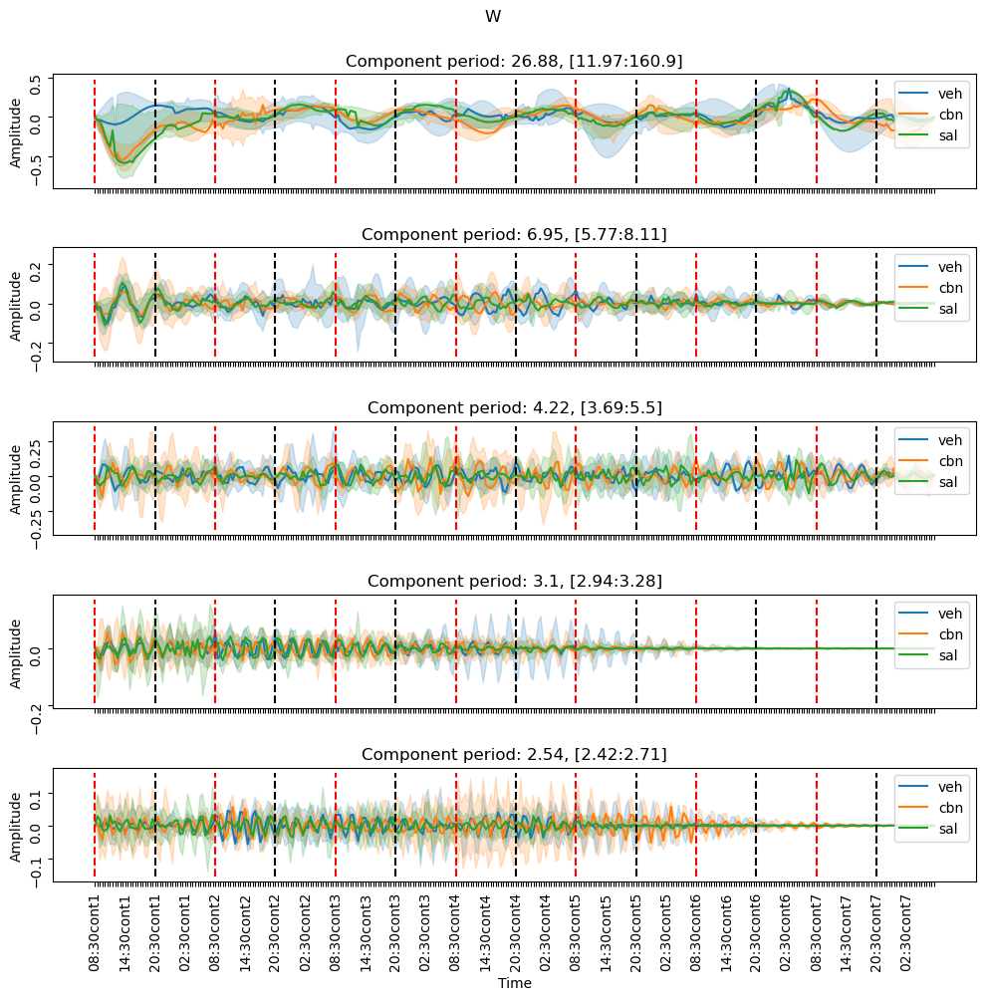

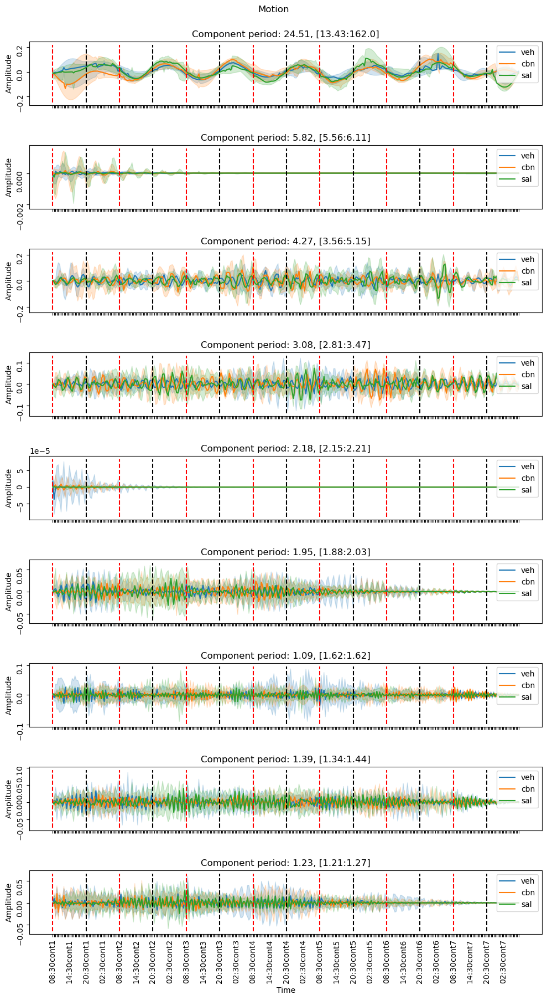

In [96]:
#slow comps by group, slow code (8 min) - should be included either way
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']

for ip, param in enumerate(params_to_plot):
    param_data = comps.loc[comps['param']==param].reset_index().dropna(axis=1)
    single_param_comps = param_data.columns.drop(['index','param','id','group'])
    fig, axs = plt.subplots(len(single_param_comps),1,figsize = (10, (len(single_param_comps))*2), sharex=True)
    for i, ax in enumerate(axs):
        period = np.round((1/(float(subs_by_param[ip][i][1])*60*60)),2)
        if period == 1.62:
            period = 1.09
        period_adj = str(period).replace('.','_')       #single_param_comps[i].strip('comp_')
        maxperiod = str(np.round(1/(float(subs_by_param[ip][i][2])*60*60),2))#.replace('.','_')
        minperiod = str(np.round(1/(float(subs_by_param[ip][i][0])*60*60),2))#.replace('.','_')
        #check if component exists
        if f'comp_{period_adj}' not in param_data.columns:
            print(f'comp_{period_adj} not in comps, continuing')
            continue
        
        sns.lineplot(data = param_data, x = 'index', y = f'comp_{period_adj}', hue = 'group', estimator='median', errorbar='ci', ax=ax)
        ax.tick_params(labelrotation=90)
        n = 12
        for index, label in enumerate(ax.xaxis.get_ticklabels()):
            if index % n != 0:
                label.set_visible(False)
        period_adj = period_adj.replace('_','.')
        if period_adj == '1_09':
            period_adj = '1_62'
        ax.set(title = f'Component period: {period_adj}, [{maxperiod}:{minperiod}]',
               xlabel = 'Time', ylabel = 'Amplitude')
        ax.legend(loc = 'upper right')
        ymin, ymax = ax.get_ylim()
        ax.vlines([i*24 for i in range(0,14,2)], ymin, ymax, color = 'r', linestyles='--')
        ax.vlines([i*24 for i in range(1,14,2)], ymin, ymax, color = 'k', linestyles='--')
    fig.suptitle(renaming_dict2[param], y = 1)
    plt.tight_layout()
    plt.savefig(f'plots/extracted_comps_by_group_{param}.png')
    plt.show()

In [97]:
#now get wave properties - phase, amplitude, peak frequency
#let's try on one comp of one rat
sr = 1/(30*60)

param = 'sensor'
id = '46'

param_subset = comps.loc[(comps['param'] == param)&(comps['id']==id)].dropna(axis = 1)
group = param_subset['group'].iloc[0]
allcomps = param_subset.columns[3:]
sel_comp = allcomps[0]
#get meanpow, maxpow, maxpowf
comp_transform_f, comp_transform_pxx = signal.periodogram(param_subset[sel_comp], fs = sr)
maxpow = comp_transform_pxx.max()
meanpow = comp_transform_pxx.mean()
maxpow_f = float(comp_transform_f[comp_transform_pxx == maxpow])
maxpow_period = (1/(maxpow_f))/(60*60)
#get peak shift - detect the first oscilation
#find peaks by local minima/maxima
peak_indices = []
for i in range(0, len(param_subset[sel_comp])-2):
    if param_subset[sel_comp].iloc[i]<param_subset[sel_comp].iloc[i+1] and param_subset[sel_comp].iloc[i+2]<param_subset[sel_comp].iloc[i+1]:
        peak_indices.append(i+1)
    elif param_subset[sel_comp].iloc[i]>param_subset[sel_comp].iloc[i+1] and param_subset[sel_comp].iloc[i+2]>param_subset[sel_comp].iloc[i+1]:
        peak_indices.append(i+1)
# plt.plot(param_subset[sel_comp])
# xmin, xmax, ymin, ymax = plt.axis()
# plt.vlines(param_subset[sel_comp].iloc[peak_indices].index, ymin, ymax)
# plt.xlim(0,20)
#finally, get peak shift
peak_shift = peak_indices[0]/2

In [98]:
comps.columns

Index(['comp_27_41', 'comp_6_88', 'comp_4_32', 'comp_3_23', 'comp_2_52',
       'param', 'id', 'group', 'comp_26_19', 'comp_7_32', 'comp_4_59',
       'comp_2_98', 'comp_2_18', 'comp_1_95', 'comp_26_88', 'comp_6_95',
       'comp_4_22', 'comp_3_1', 'comp_2_54', 'comp_24_51', 'comp_5_82',
       'comp_4_27', 'comp_3_08', 'comp_1_39', 'comp_1_23', 'comp_1_09'],
      dtype='object')

In [99]:
#now the params I want are PARAM< ID, GROUP, COMP, MAXPOW, MAXPOW_PERIOD, MEANPOW, PEAK_SHIFT

sr = 1/(30*60)

comp_res = []

for id in comps['id'].unique():
    for param in comps['param'].unique():
        param_subset = comps.loc[(comps['param'] == param)&(comps['id']==id)].dropna(axis = 1).dropna()
        group = param_subset['group'].iloc[0]
        allcomps = param_subset.columns.drop(['param', 'id', 'group'])
        for sel_comp in allcomps:
            #get meanpow, maxpow, maxpowf
            comp_transform_f, comp_transform_pxx = signal.periodogram(param_subset[sel_comp], fs = sr)
            maxpow = float(comp_transform_pxx.max())
            meanpow = float(comp_transform_pxx.mean())
            maxpow_f = float(comp_transform_f[comp_transform_pxx == maxpow])
            maxpow_period = float((1/(maxpow_f))/(60*60))
            #get peak shift - detect the first oscilation
            #find peaks by local minima/maxima
            peak_indices = []
            for i in range(0, len(param_subset[sel_comp])-2):
                if param_subset[sel_comp].iloc[i]<param_subset[sel_comp].iloc[i+1] and param_subset[sel_comp].iloc[i+2]<param_subset[sel_comp].iloc[i+1]:
                    peak_indices.append(i+1)
                elif param_subset[sel_comp].iloc[i]>param_subset[sel_comp].iloc[i+1] and param_subset[sel_comp].iloc[i+2]>param_subset[sel_comp].iloc[i+1]:
                    peak_indices.append(i+1)
            #finally, get peak shift
            peak_shift = float(peak_indices[0]/2)
            #now create res and add to list
            singlerat_res = pd.DataFrame([param, id, group, sel_comp, maxpow, meanpow, maxpow_period, peak_shift]).T
            singlerat_res.columns = ['param','id','group','comp','maxpow','meanpow','maxpow_period','peak_shift']
            comp_res.append(singlerat_res)
comp_res = pd.concat(comp_res)

In [102]:
comp_res.drop('id',axis= 1).groupby(['param','comp','group']).agg(['median',q1,q3]).to_excel('results/tween_comp_param_res.xlsx')

In [104]:
spect_renaming_dict = {'maxpow':'Maximum power', 'meanpow':'Average power', 'maxpow_period':'Period of maximum power, h', 'peak_shift':'Shift of first peak, h'}

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


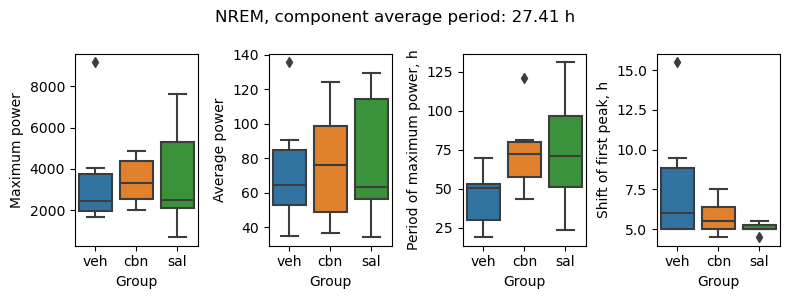

found 2 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 2 outliers
found 1 outliers


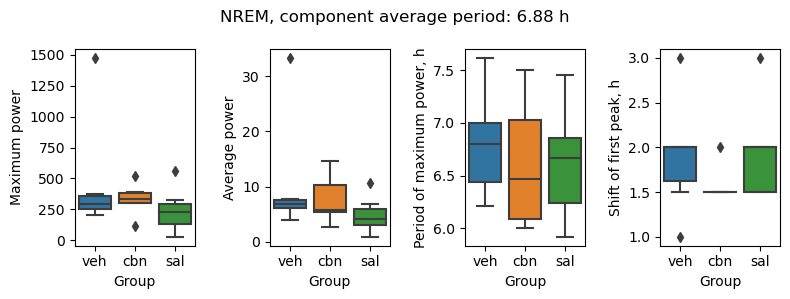

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


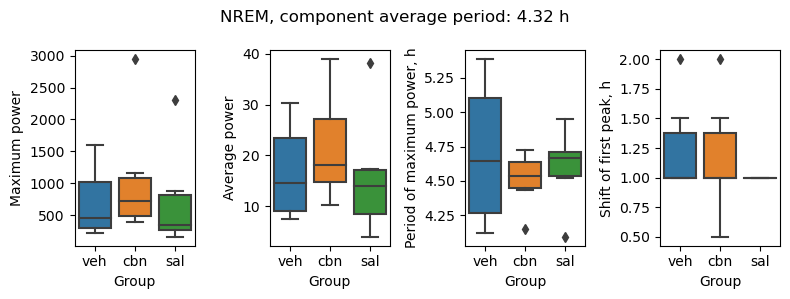

found 1 outliers
found 1 outliers
found 2 outliers
found 1 outliers


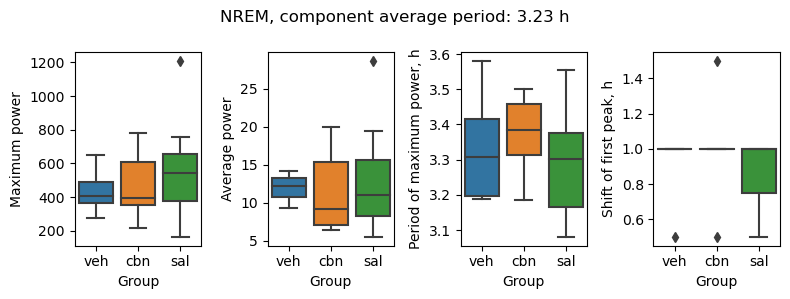

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


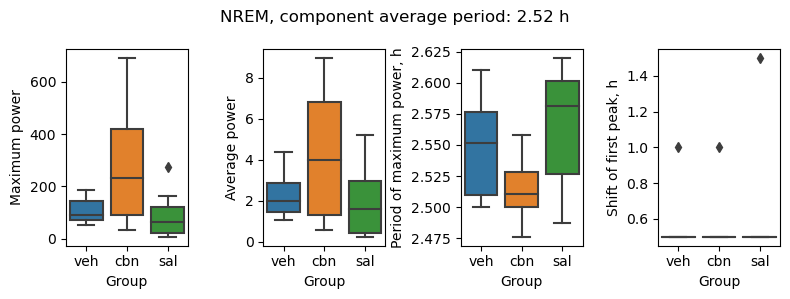

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
kruskal of peak_shift significant
n cbn: 5, n veh: 6, n sal: 7
param rem_perc, comp comp_26_19 
p = 0.02660325639034786, stat = 7.253443299995031
Dunn posthoc Bonferroni corr significant
          cbn       veh       sal
cbn  1.000000  1.000000  0.099721
veh  1.000000  1.000000  0.047085
sal  0.099721  0.047085  1.000000




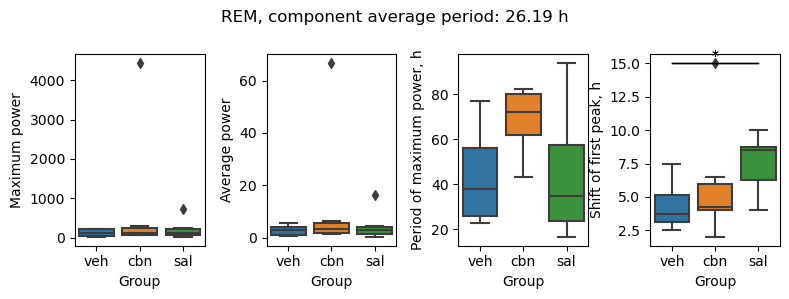

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


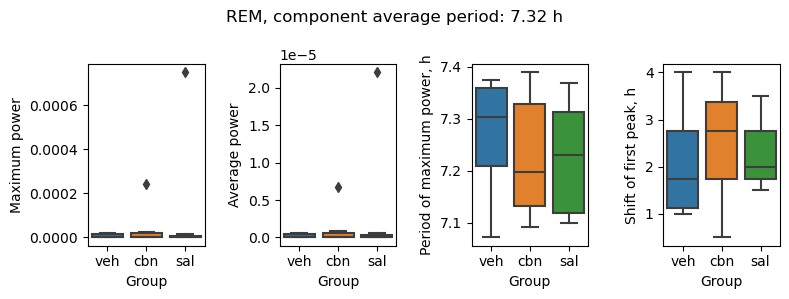

found 1 outliers
found 1 outliers
found 1 outliers


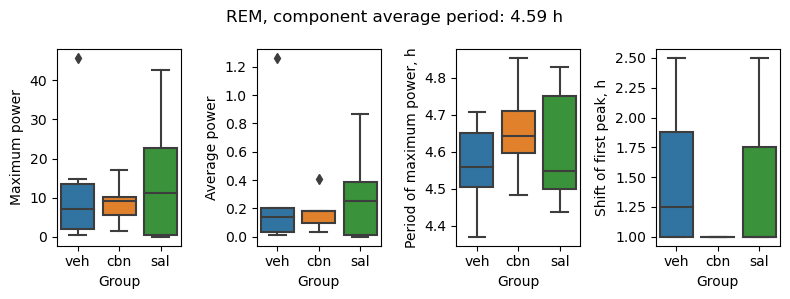

found 1 outliers
found 1 outliers
found 1 outliers


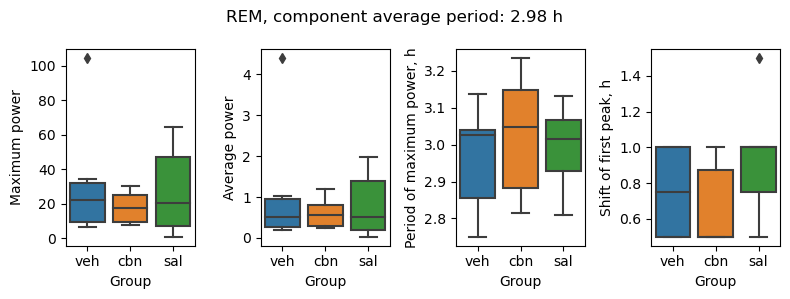

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 2 outliers


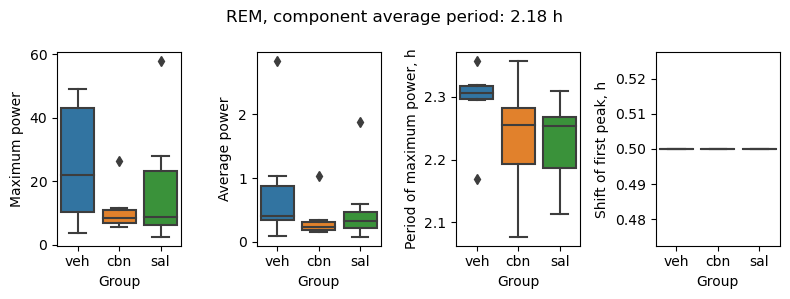

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


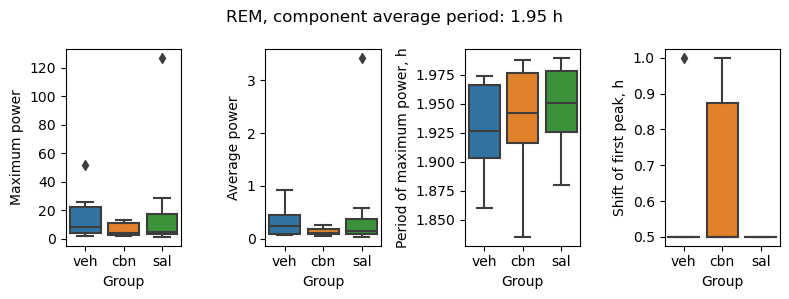

found 1 outliers
found 2 outliers


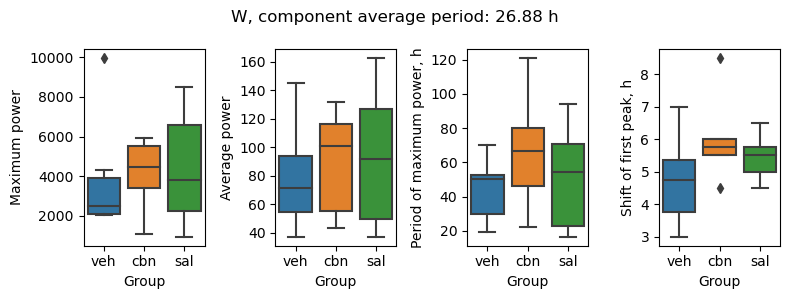

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


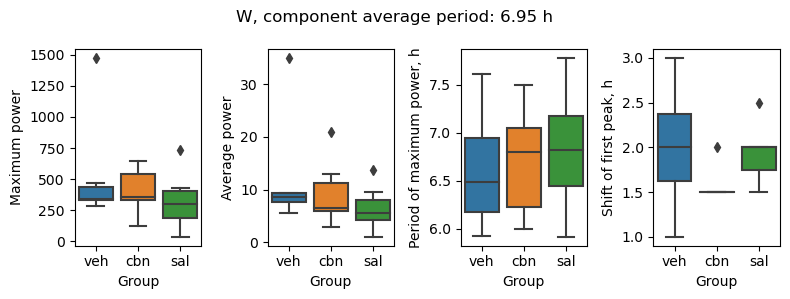

found 1 outliers
found 1 outliers
found 1 outliers
found 2 outliers
found 1 outliers


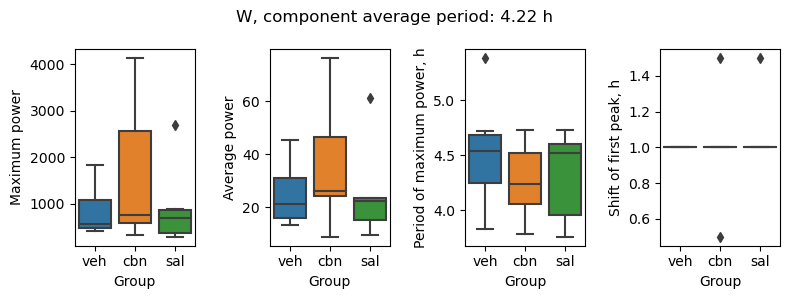

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


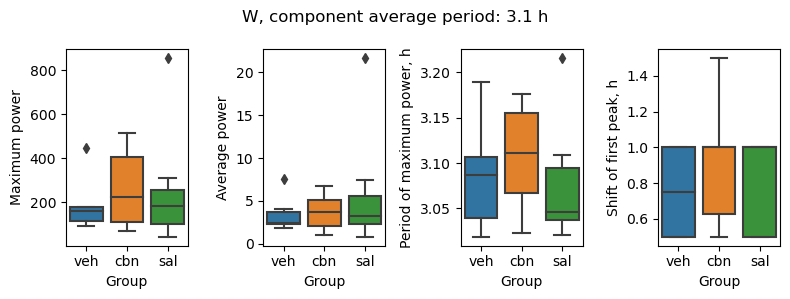

found 1 outliers
found 2 outliers
found 1 outliers
found 1 outliers
found 1 outliers


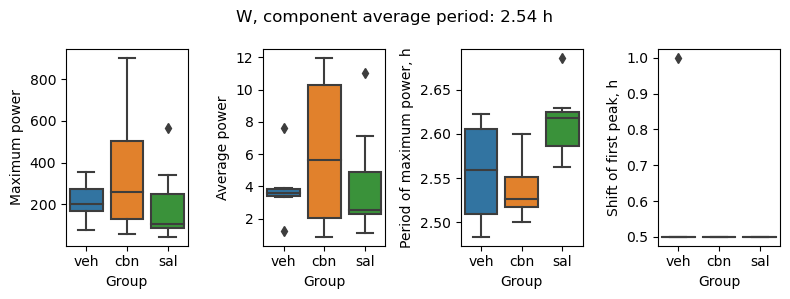

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


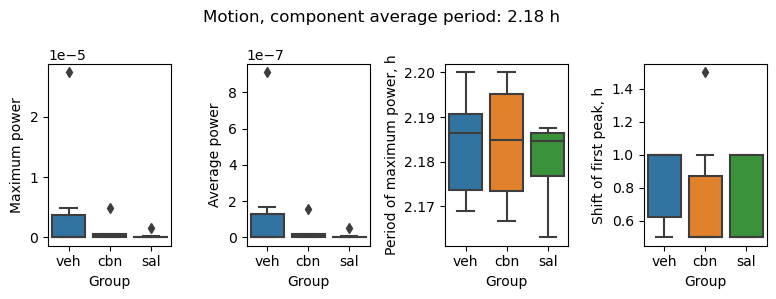

found 1 outliers
found 1 outliers
found 1 outliers


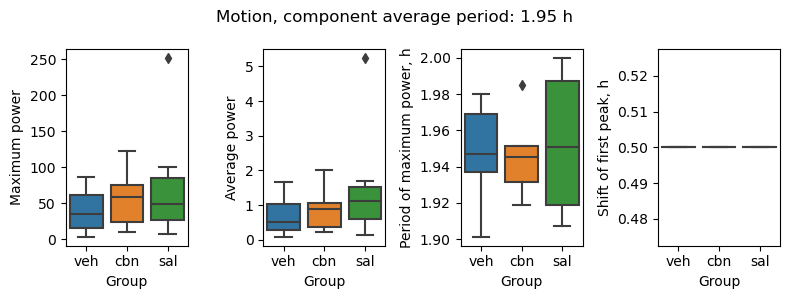

found 2 outliers
found 1 outliers
found 2 outliers
found 2 outliers
found 1 outliers
found 1 outliers


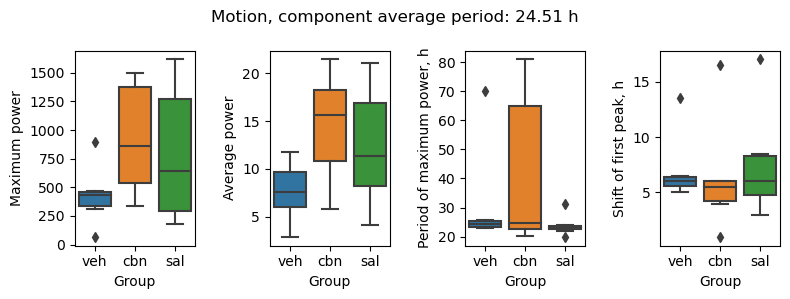

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


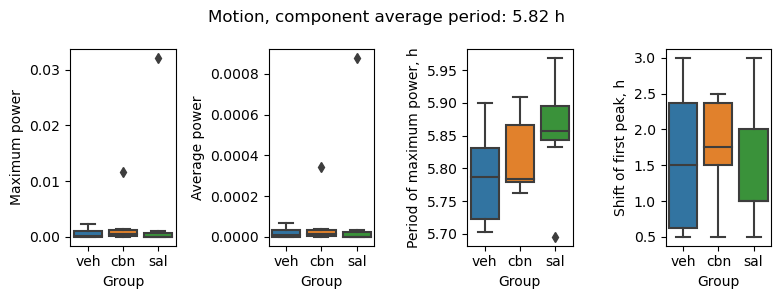

found 1 outliers
found 1 outliers
found 1 outliers
found 2 outliers
found 1 outliers


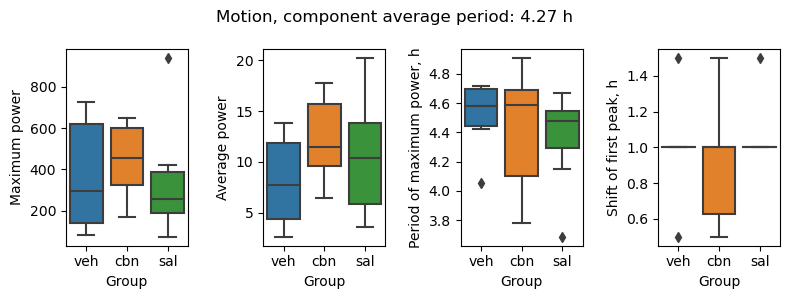

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
kruskal of meanpow significant
n cbn: 5, n veh: 5, n sal: 6
param sensor, comp comp_3_08 
p = 0.014264233908999254, stat = 8.5
Dunn posthoc Bonferroni corr significant
          cbn       veh       sal
cbn  1.000000  0.071778  1.000000
veh  0.071778  1.000000  0.017777
sal  1.000000  0.017777  1.000000




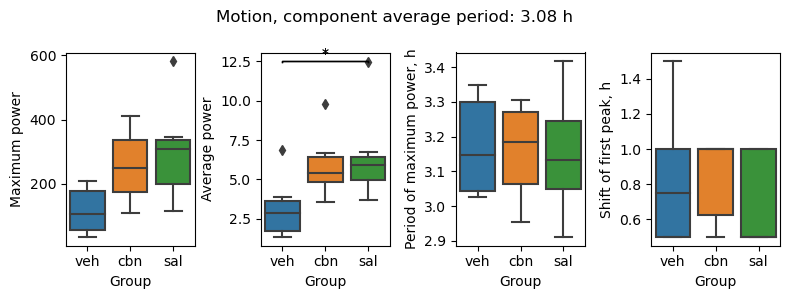

found 1 outliers
found 1 outliers
kruskal of meanpow significant
n cbn: 6, n veh: 6, n sal: 7
param sensor, comp comp_1_39 
p = 0.04698651013649844, stat = 6.115789473684217
Dunn posthoc Bonferroni corr significant
         cbn       veh       sal
cbn  1.00000  1.000000  0.049780
veh  1.00000  1.000000  0.296646
sal  0.04978  0.296646  1.000000


found 1 outliers


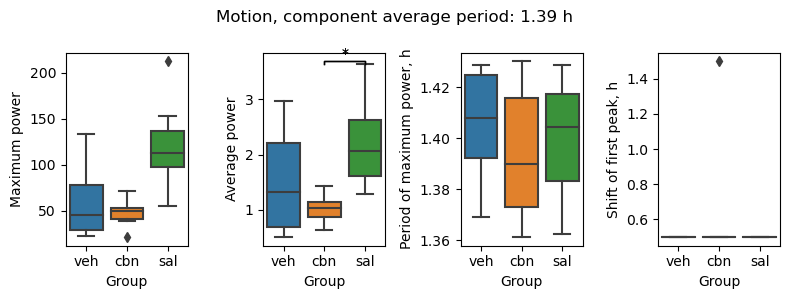

found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers
found 1 outliers


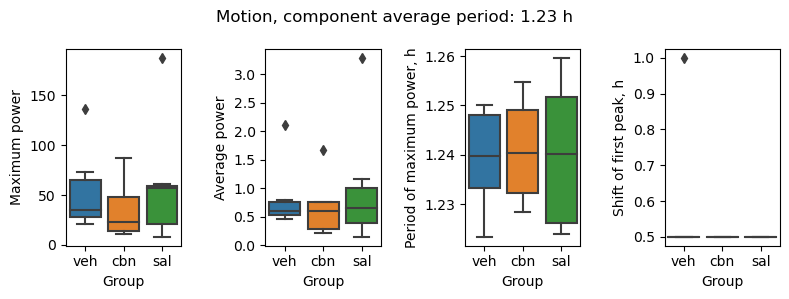

found 1 outliers
found 1 outliers
found 2 outliers
found 1 outliers


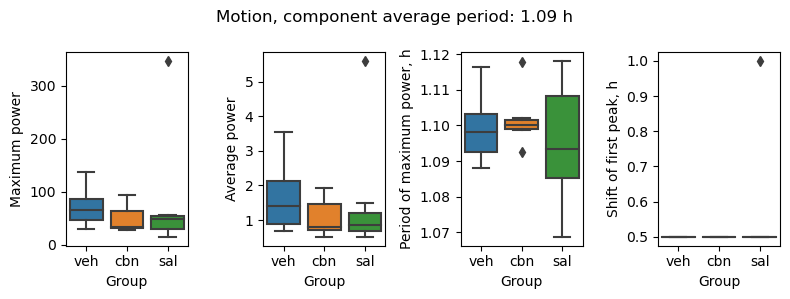

In [105]:

#plot all comps
measures = ['maxpow','meanpow','maxpow_period','peak_shift']
params = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
#save to file
f = open('results/tween_comp_stats.txt','w')
for param in params:
    for comp in comp_res['comp'].unique():
        to_plot = comp_res.loc[(comp_res['param'] == param)&(comp_res['comp'] == comp)].dropna()
        if len(to_plot) > 0:
            fig, ax = plt.subplots(1,4, figsize = (8,3))
            
            for i, measure in enumerate(measures):
                signif = []
                #stats
                cbn = to_plot[to_plot['group']=='cbn'][measure]
                veh = to_plot[to_plot['group']=='veh'][measure]
                sal = to_plot[to_plot['group']=='sal'][measure]            
                
                cbn = reject_outliers(cbn)
                veh = reject_outliers(veh)
                sal = reject_outliers(sal)
                
                if np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh) and np.mean(cbn) != np.mean(veh) and np.mean(cbn) != np.mean(sal) and np.mean(sal) != np.mean(veh):# and len(set(cbn))>1:
                    stat, p = stats.kruskal(cbn, veh, sal)
                    if p < 0.05:
                        print(f'kruskal of {measure} significant')
                        print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
                        f.write(f'kruskal of {measure} significant\n') 
                        f.write(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}\n')               
                        dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                        dunn_res.columns = ['cbn','veh','sal']
                        dunn_res.index = ['cbn','veh','sal']
                        if (dunn_res <= 0.05).any().any():
                            print(f'param {param}, comp {comp} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant')   
                            print(dunn_res)
                            print('\n')
                            f.write(f'param {param}, comp {comp} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant\n')
                            f.write(dunn_res.to_string())
                            f.write('\n')
                            
                            #here add to list
                            for p_col in dunn_res.columns:
                                for p_row in dunn_res.index:
                                    p = dunn_res.loc[p_row, p_col]
                                    if p < 0.05:
                                        signif.append([p_row, p_col])
                        else:
                            print('posthoc ns')
                            f.write('posthoc ns\n')
                #plot
                sns.boxplot(data = to_plot, x = 'group', y = measure, ax = ax[i])
                ax[i].set(xlabel = 'Group', ylabel = spect_renaming_dict[measure])
                #add significance bars
                offset = 0.25
                y = to_plot[measure].max()
                h = 0.05
                
                conversion = {'veh':0, 'cbn':1, 'sal':2}
                
                for result in signif:
                    #mark xmin, xmax
                    xmin = conversion[result[0]]
                    xmax = conversion[result[1]]
                    ax[i].plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
                    ax[i].text((xmin+xmax)*.5, y+h, "*", ha='center', va='bottom', color='k')
            comp_period = comp.strip('comp_').replace('_','.')
            fig.suptitle(f'{renaming_dict2[param]}, component average period: {comp_period} h')
            plt.tight_layout()
            plt.savefig(f'plots/compres/{renaming_dict2[param]}_{comp}.png')
            plt.show()
f.close()

In [106]:
#try to find the start of rec of each id
#find the break between 8:30 and 9:30
#get subset 8:30-9:30 for each rat
latencies = []
for id in tqdm(data['id'].unique()):
    #set start of rec between 8:30 and 9:30
    subset = data[data['id']==id].between_time('08:30','09:30')#.groupby(data.index.day).sum()
    subset = subset.drop(['delta','theta','alpha','beta','gamma','emg','cluster','sensor'], axis = 1)
    subset['day'] = subset.index.strftime('%Y%m%d')
    for day in subset['day'].unique():
        sub_day = subset[subset['day']==day]
        sub_day = sub_day.reset_index().rename(columns = {'index':'time'})
        #select breaks (diff != 1s), set start time for the day
        # if len(sub_day[(sub_day['time'].diff()!=pd.Timedelta(seconds=1))]) < 2:
        #     start_time = (sub_day[(sub_day['time'].diff()!=pd.Timedelta(seconds=1))]).iloc[0]['time']
        # else:
        start_time = (sub_day[(sub_day['time'].diff()!=pd.Timedelta(seconds=1))])['time'].max()
            
        #subset the subset
        after_start = sub_day[sub_day['time'] > start_time]
        if len(after_start[after_start['sleep'] == 'N']) > 0:
            first_sleep = after_start[after_start['sleep'] == 'N']['time'].iloc[0]
            latency_s = (first_sleep - start_time).seconds
        else:
            latency_s = 3600
        lat_df = pd.DataFrame([start_time, id, day, latency_s]).T
        lat_df.columns = ['start_time','id','day','latency_s']
        latencies.append(lat_df)
latencies = pd.concat(latencies)

100%|██████████| 31/31 [00:26<00:00,  1.18it/s]


In [108]:
#set group
latencies['group'] = 'sal'
latencies['group'].loc[latencies['id'].isin(w_cbn_ids)] = 'w_cbn'
latencies['group'].loc[latencies['id'].isin(w_sal_ids)] = 'w_sal'
latencies['group'].loc[latencies['id'].isin(cbn_ids)] = 'cbn'
latencies['group'].loc[latencies['id'].isin(veh_ids)] = 'veh'

In [109]:
#set injs
latencies['inj'] = 'none'
for date in single_inj_dates:
    latencies['inj'][(latencies['start_time']>date)&(latencies['start_time']<date+pd.DateOffset(hours=24))] = 'single'
for i, day in enumerate(cont_inj_dates):
    for date in day:
        latencies['inj'][(latencies['start_time']>date)&(latencies['start_time']<date+pd.DateOffset(hours=24))]=f'cont{i+1}'

In [110]:
latencies['latency_s'] = latencies['latency_s'].astype(float)

In [111]:
#could try to get rat medians where inj != none
med_lat_list = []
for id in latencies['id'].unique():
    if len(latencies[(latencies['id'] == id) & (latencies['inj'] != 'none') & (~latencies['inj'].isin(sp_exp))])> 0:
        lat_med = latencies[(latencies['id'] == id) & (latencies['inj'] != 'none') & (~latencies['inj'].isin(sp_exp))].groupby('id').median(numeric_only = True)
        lat_med['id'] = id
        lat_med['group'] = latencies[latencies['id'] == id]['group'].iloc[0]
        med_lat_list.append(lat_med)
med_lat_full = pd.concat(med_lat_list)

In [112]:
#medians of latency
injs = ['single', 'cont1','cont2','cont3','cont4','cont5','cont6','cont7']
to_plot = latencies.loc[(latencies['inj'].isin(injs))&(~latencies['group'].isin(w_exp))].groupby(['id','group']).median(numeric_only=True).reset_index().dropna()

cbn = to_plot[(to_plot['group']=='cbn')]['latency_s']
veh = to_plot[(to_plot['group']=='veh')]['latency_s']
sal = to_plot[(to_plot['group']=='sal')]['latency_s'] 

cbn = reject_outliers(cbn)
veh = reject_outliers(veh)
sal = reject_outliers(sal)

print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
if np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh) and np.mean(cbn) != np.mean(veh) and np.mean(cbn) != np.mean(sal) and np.mean(sal) != np.mean(veh):
    stat, p = stats.kruskal(cbn, veh, sal)
    if p < 0.05:
        print(f'kruskal significant')
        print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')                
        dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
        dunn_res.columns = ['cbn','veh','sal']
        dunn_res.index = ['cbn','veh','sal']
        if (dunn_res <= 0.05).any().any():
            print(f'param {param}, comp {comp} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant')   
            print(dunn_res)
            print('\n')
        else:
            print('posthoc ns')

found 1 outliers
n cbn: 6, n veh: 7, n sal: 7


In [113]:
#do for every inj status
injs = ['single', 'cont1','cont2','cont3','cont4','cont5','cont6','cont7']
axs = range(len(injs))
for i, ax in enumerate(axs):
    to_plot = latencies.loc[(latencies['inj']==injs[i])&(~latencies['group'].isin(w_exp))].groupby(['id','group']).median(numeric_only=True).reset_index().dropna()

    cbn = to_plot[(to_plot['group']=='cbn')]['latency_s']
    veh = to_plot[(to_plot['group']=='veh')]['latency_s']
    sal = to_plot[(to_plot['group']=='sal')]['latency_s'] 
    
    cbn = reject_outliers(cbn)
    veh = reject_outliers(veh)
    sal = reject_outliers(sal)

    print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
    if np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh) and np.mean(cbn) != np.mean(veh) and np.mean(cbn) != np.mean(sal) and np.mean(sal) != np.mean(veh):
        stat, p = stats.kruskal(cbn, veh, sal)
        if p < 0.05:
            print(f'kruskal of {injs[i]} significant')
            print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')                
            dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
            dunn_res.columns = ['cbn','veh','sal']
            dunn_res.index = ['cbn','veh','sal']
            if (dunn_res <= 0.05).any().any():
                print(f'p = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant')   
                print(dunn_res)
                print('\n')
            else:
                print('posthoc ns')

found 1 outliers
n cbn: 4, n veh: 7, n sal: 5
n cbn: 6, n veh: 3, n sal: 4
found 1 outliers
found 1 outliers
found 1 outliers
n cbn: 6, n veh: 4, n sal: 5
found 1 outliers
found 2 outliers
n cbn: 5, n veh: 3, n sal: 5
found 1 outliers
found 1 outliers
n cbn: 5, n veh: 5, n sal: 5
found 1 outliers
n cbn: 4, n veh: 4, n sal: 5
found 1 outliers
found 1 outliers
n cbn: 5, n veh: 5, n sal: 6
found 1 outliers
n cbn: 3, n veh: 3, n sal: 2


In [114]:
to_plot =latencies.loc[(~latencies['group'].isin(w_exp))&(~latencies['inj'].isin(sp_exp))&(latencies['inj']!='none')]
to_plot = to_plot.sort_values(by = 'inj')

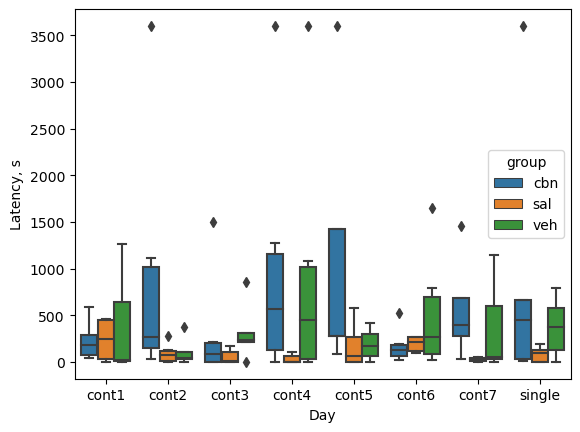

In [115]:
sns.boxplot(data = to_plot , x = 'inj', y = 'latency_s', hue = 'group')
plt.ylabel('Latency, s')
plt.xlabel('Day')
plt.savefig('plots/tween_latencies.png', dpi = 300, transparent = True)
plt.show()

cbn param nrem_perc rval: 0.9987694432669859, slope: 0.8842181020656793
veh param nrem_perc rval: 0.9997755763428633, slope: 0.9649018521516594
sal param nrem_perc rval: 0.9997486516754552, slope: 1.0795455997077108
cbn param rem_perc rval: 0.9820794460910808, slope: 0.012200786078278512
veh param rem_perc rval: 0.9874614101984148, slope: 0.01698740456159543
sal param rem_perc rval: 0.9945741085804393, slope: 0.034110581946358215
cbn param w_perc rval: 0.9993380634977426, slope: 1.0755080062750662
veh param w_perc rval: 0.9998056436080508, slope: 0.9771094175938183
sal param w_perc rval: 0.999543666939806, slope: 0.8534087360372409
cbn param sensor rval: 0.998252063369768, slope: 0.18641194558171614
veh param sensor rval: 0.9981910671516849, slope: 0.15457924346773227
sal param sensor rval: 0.998717443174738, slope: 0.18828184407186274


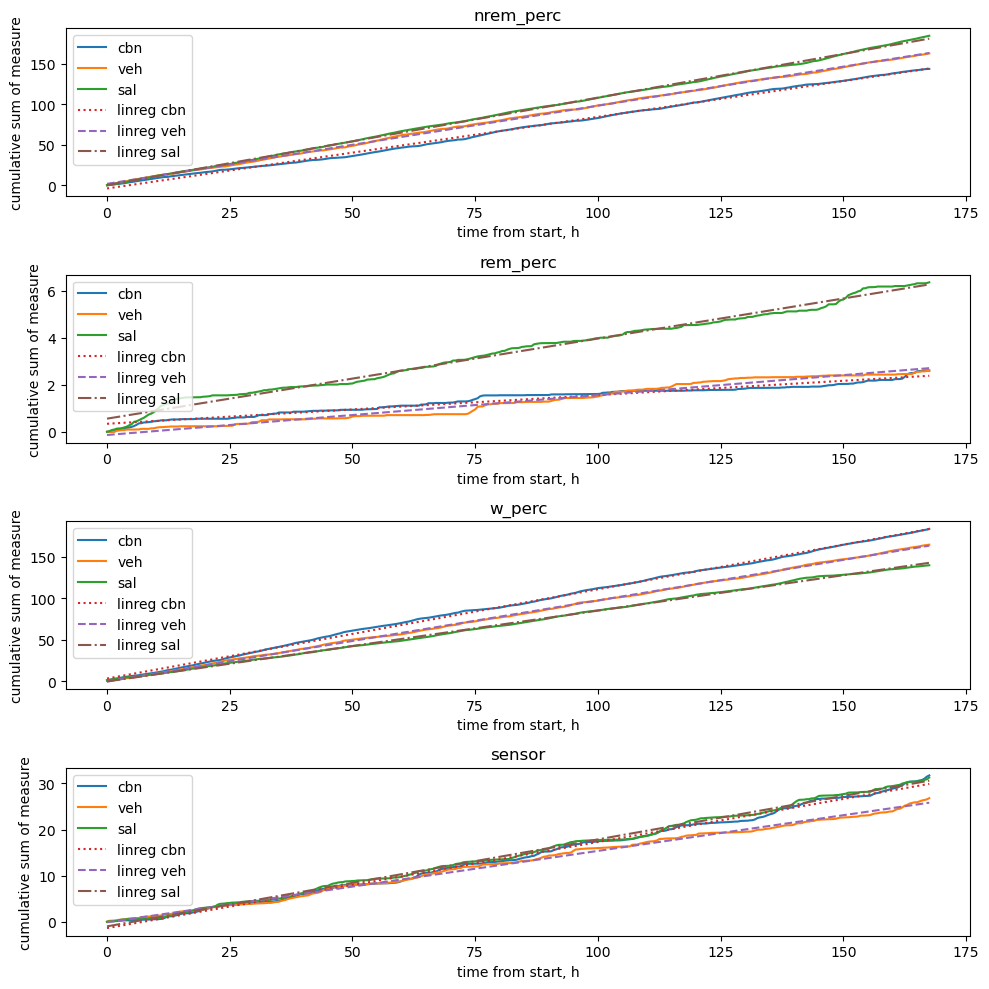

In [116]:
#cumsum is an idea - might be different in groups?
#this is cumsum for medians
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
fig, axs = plt.subplots(4,figsize=(10,10))
for i, ax in enumerate(axs):
    
    cbn = np.cumsum(cont_res[cont_res['group']=='cbn'].groupby(['time_adj']).median(numeric_only = True)[params_to_plot[i]].to_numpy())
    veh = np.cumsum(cont_res[cont_res['group']=='veh'].groupby(['time_adj']).median(numeric_only = True)[params_to_plot[i]].to_numpy())
    sal = np.cumsum(cont_res[cont_res['group']=='sal'].groupby(['time_adj']).median(numeric_only = True)[params_to_plot[i]].to_numpy())
    time = np.arange(0,len(veh),1)/2
    
    #fit linear model to data - linreg
    reg_cbn = stats.linregress(time, cbn)
    reg_veh = stats.linregress(time, veh)
    reg_sal = stats.linregress(time, sal)    
    
    ax.plot(time, cbn, label = 'cbn')
    ax.plot(time, veh, label = 'veh')
    ax.plot(time, sal, label = 'sal')
    
    ax.plot(time, reg_cbn.intercept + reg_cbn.slope*time, linestyle = ':', label = 'linreg cbn')
    ax.plot(time, reg_veh.intercept + reg_veh.slope*time, linestyle = '--', label = 'linreg veh')
    ax.plot(time, reg_sal.intercept + reg_sal.slope*time, linestyle = '-.', label = 'linreg sal')    
    ax.legend()
    ax.set(xlabel = 'time from start, h', ylabel = 'cumulative sum of measure', title = params_to_plot[i])
    
    print(f'cbn param {params_to_plot[i]} rval: {reg_cbn.rvalue}, slope: {reg_cbn.slope}')
    print(f'veh param {params_to_plot[i]} rval: {reg_veh.rvalue}, slope: {reg_veh.slope}')
    print(f'sal param {params_to_plot[i]} rval: {reg_sal.rvalue}, slope: {reg_sal.slope}')
    
plt.tight_layout()
plt.savefig('plots/cumsum_medians_linreg.png', dpi = 300, transparent = True)

In [117]:
#get cumsum by rat - do over
cumsums = []
for id in cont_res['id'].unique():
    params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
    param_cs = []
    # fig, axs = plt.subplots(4,figsize=(10,10))
    # for i, ax in enumerate(axs):
    for param in params_to_plot:
        #calculate cumsum, interpolate missing values linearly, then bfill
        cumsum = cont_res.loc[cont_res['id']==id].groupby(['time_adj']).median(numeric_only = True).reset_index()[param].fillna(method = 'ffill').fillna(method = 'bfill').cumsum()#.fillna(method = 'ffill')#.interpolate(method = 'nearest')##
        param_cs.append(cumsum)
    time = pd.Series(np.arange(0, len(cumsum))/2, name='time')
    param_cs.append(time)
    param_cs = pd.DataFrame(param_cs).T
    param_cs.columns = ['nrem_perc','rem_perc','w_perc','sensor','time']
    param_cs['id'] = id
    param_cs['group'] = cont_res[cont_res['id']==id]['group'].iloc[0]
    cumsums.append(param_cs)
cumsums = pd.concat(cumsums)

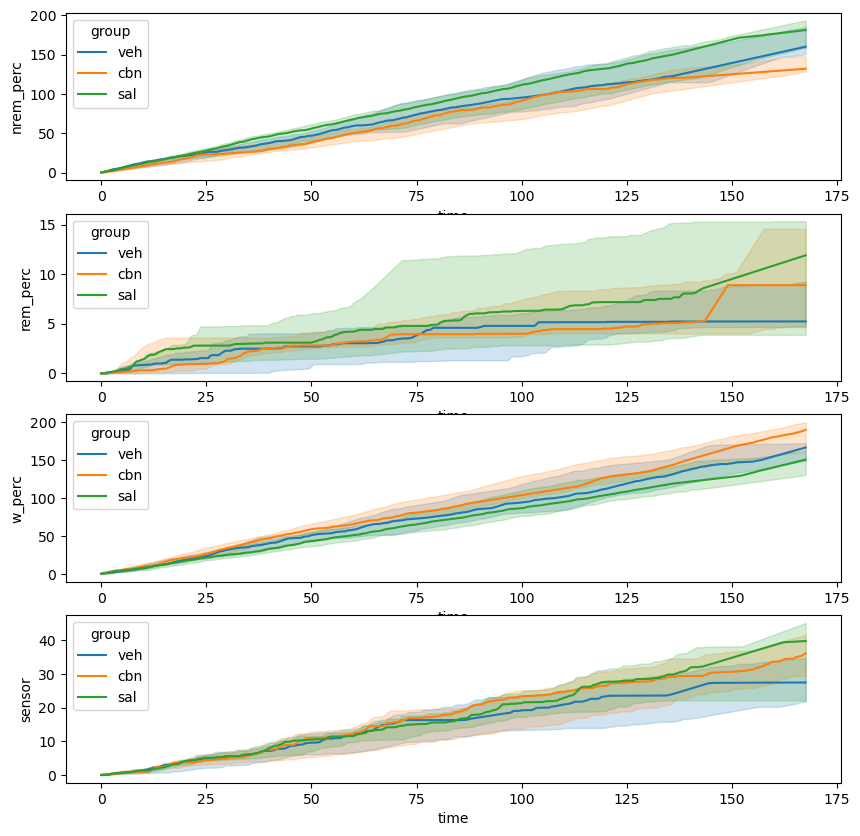

In [118]:
#plot medians with ci - slow (1 min)
#interpolation might be wrong, because median results are different
#with no nan fills it's even weirder
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']
fig, axs = plt.subplots(4,1,figsize = (10,10))
for i, ax in enumerate(axs):
    sns.lineplot(data = cumsums.reset_index(), x = 'time', y = params_to_plot[i], hue = 'group', ax=ax, estimator='median', errorbar='ci')

In [119]:
#now calculate linreg, check stats of slope and r2 - ns
params_to_plot = ['nrem_perc', 'rem_perc', 'w_perc', 'sensor']

id = '46'
for param in params_to_plot:
    
    linreg_res = []
    
    for id in cumsums['id'].unique():    
        group = cumsums[cumsums['id']==id]['group'].iloc[0]
        reg = stats.linregress(cumsums[cumsums['id']==id]['time'], cumsums[cumsums['id']==id][param])
        r2 = reg.rvalue
        slope = reg.slope
        rat_lr = pd.DataFrame([id, group, r2, slope]).T
        rat_lr.columns = ['id', 'group', 'r2', 'slope']
        linreg_res.append(rat_lr)
    linreg_res = pd.concat(linreg_res)

    for lr_res in ['slope', 'r2']:
        cbn = linreg_res[linreg_res['group']=='cbn'][lr_res].to_numpy()
        veh = linreg_res[linreg_res['group']=='veh'][lr_res].to_numpy()
        sal = linreg_res[linreg_res['group']=='sal'][lr_res].to_numpy()
        cbn = reject_outliers(cbn)
        veh = reject_outliers(veh)
        sal = reject_outliers(sal)

        print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
        if np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh) and np.mean(cbn) != np.mean(veh) and np.mean(cbn) != np.mean(sal) and np.mean(sal) != np.mean(veh):
            stat, p = stats.kruskal(cbn, veh, sal)
            print(stat, p)
            if p < 0.05:
                print(f'kruskal of {param} {lr_res} significant')
                print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')                
                dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                dunn_res.columns = ['cbn','veh','sal']
                dunn_res.index = ['cbn','veh','sal']
                if (dunn_res <= 0.05).any().any():
                    print(f'p = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant')   
                    print(dunn_res)
                    print('\n')
                else:
                    print('posthoc ns')

found 1 outliers
n cbn: 6, n veh: 7, n sal: 7
5.792517006802726 0.05522947485730248
found 1 outliers
n cbn: 7, n veh: 6, n sal: 7
0.4068027210884395 0.8159506852848493
found 1 outliers
found 1 outliers
n cbn: 6, n veh: 6, n sal: 7
2.6932330827067688 0.260118874886617
found 1 outliers
found 1 outliers
n cbn: 6, n veh: 7, n sal: 6
3.1789473684210563 0.20403296925304729
n cbn: 7, n veh: 7, n sal: 7
2.589981447124316 0.27390040513974384
found 1 outliers
n cbn: 6, n veh: 7, n sal: 7
2.7448979591836746 0.25348541817642606
n cbn: 7, n veh: 7, n sal: 7
1.2096474953617786 0.5461706820061782
found 1 outliers
n cbn: 7, n veh: 6, n sal: 7
0.5897959183673365 0.7446075639531646


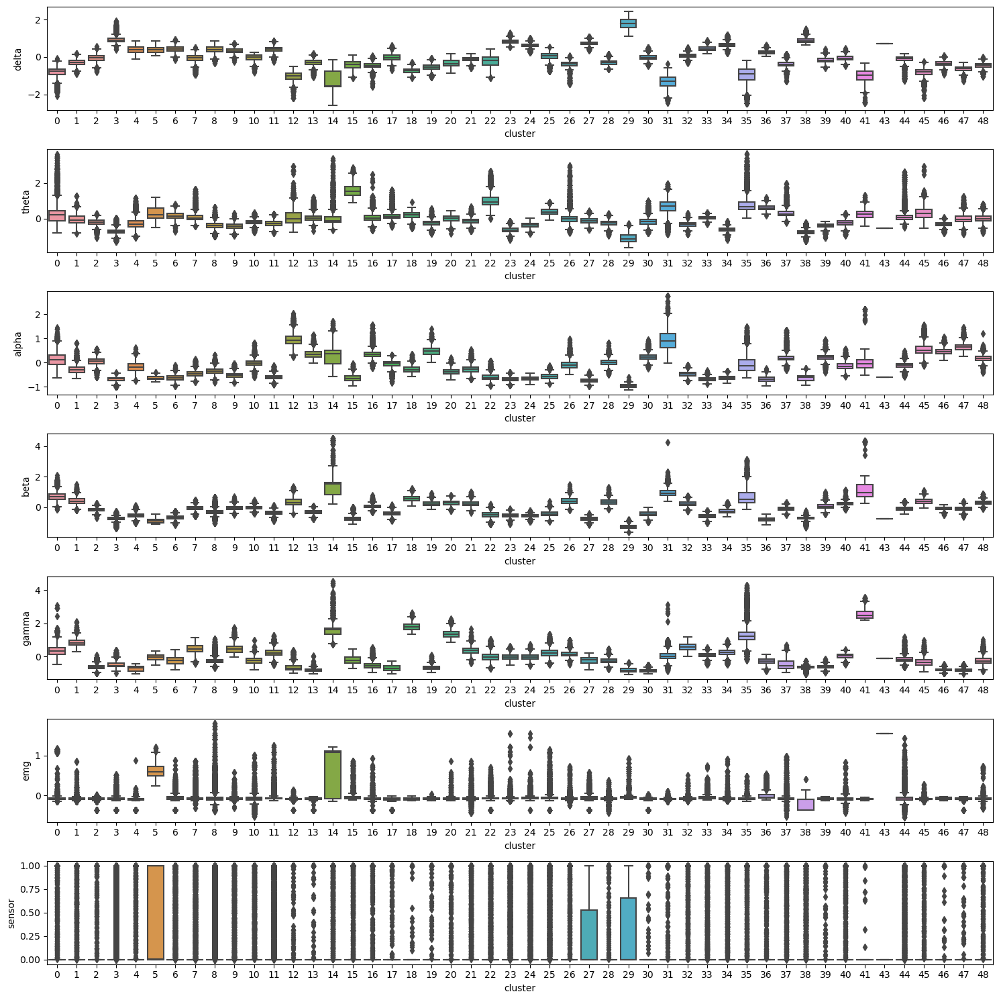

In [120]:
#NEXT - cluster descriptions, need to include IDs because clusters are different for each rat
params = ['delta', 'theta', 'alpha', 'beta', 'gamma', 'emg', 'sensor']
id = '46'
eval_data = data[data['id']==id]
fig, axs = plt.subplots(len(params), 1, figsize = (15,15))
for i, ax in enumerate(axs):
    sns.boxplot(data  = eval_data, x = 'cluster', y = params[i], ax=ax)
plt.tight_layout()
plt.savefig('plots/clusters_by_param.png')

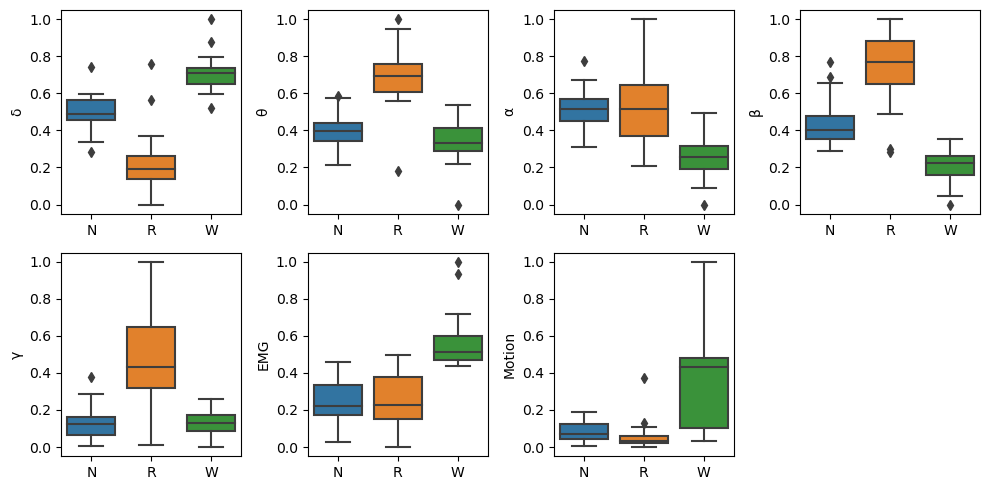

In [121]:
#slow - 40s
col_renaming_dict = {'delta':'δ', 'theta':'θ', 'alpha':'α', 'beta':'β', 'gamma':'γ', 'emg':'EMG', 'sensor':'Motion'}
params = ['delta', 'theta', 'alpha', 'beta', 'gamma', 'emg', 'sensor']
id = '46'
eval_data = data.groupby(['id','sleep']).mean().reset_index()
eval_data[params] = eval_data[params].apply(minmax_scale, axis = 0)
fig, axs = plt.subplots(2, 4, figsize = (10,5), sharey=False)
for i in range(0,len(params)):
    if i > 3:
        i_row = 1
        i_col = i-4
    else:
        i_row = 0
        i_col = i
    sns.boxplot(data  = eval_data, x = 'sleep', y = params[i], ax=axs[i_row][i_col])
    axs[i_row][i_col].set(xlabel=None, ylabel=col_renaming_dict[params[i]])
axs[1][3].axis('off')
plt.tight_layout()
plt.savefig('plots/sleep_by_params.png')

In [122]:
#calculating silhouette scores for cluster evaluation
from sklearn.metrics import silhouette_score
scores = []
for id in tqdm(data['id'].unique()):
    eval_data = data[data['id']==id]
    #calculate silhouette score
    idx = np.random.randint(len(eval_data), size=10000)
    subset=eval_data.iloc[idx]
    labels = subset['cluster']
    X = subset[params[:-1]]
    score = silhouette_score(X, labels)
    scores.append(score)
    # print(f'rat {id} silhouette score by cluster is: {score}')
print(f'average silhouette score for clustering is {np.mean(scores)}')
#>0 means datapoints closer to their cluster center than to other cluster centers
#<0 is bad, the more the better

100%|██████████| 31/31 [00:49<00:00,  1.59s/it]

average silhouette score for clustering is 0.08628028530520712


In [123]:
#now do the same thing for sleep states 
scores = []
for id in tqdm(data['id'].unique()):
    eval_data = data[data['id']==id]
    #calculate silhouette score
    idx = np.random.randint(len(eval_data), size=10000)
    subset=eval_data.iloc[idx]
    labels = subset['sleep']
    X = subset[params[:-1]]
    score = silhouette_score(X, labels)
    # print(f'rat {id} silhouette score by sleep state is: {score}')
    scores.append(score)
print(f'average silhouette score for sleep states is {np.mean(scores)}')
#>0 means datapoints closer to their cluster center than to other cluster centers
#<0 is bad, the more the better

100%|██████████| 31/31 [00:51<00:00,  1.67s/it]

average silhouette score for sleep states is 0.05749553391696675


In [124]:
#sleep state durations
duration_analysis = data.drop(['delta','theta','alpha','beta','gamma','emg','cluster','sensor'], axis = 1)

In [125]:
duration_analysis['sleep_numeric'] = duration_analysis['sleep'].replace({'W':0,'N':1, 'R':2})

In [126]:
duration_analysis['diff'] = duration_analysis['sleep_numeric'].diff()

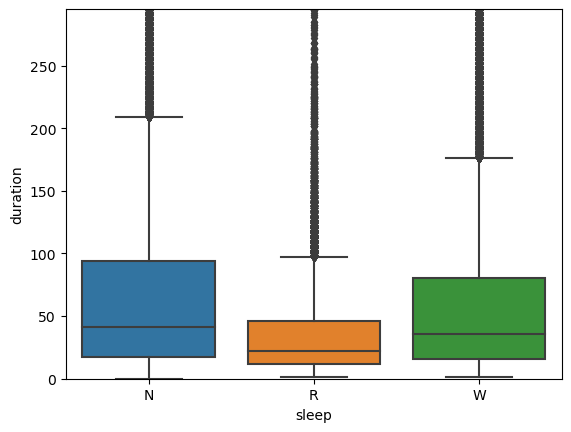

In [127]:
#can also later do by id/group
state_switches = duration_analysis.loc[(duration_analysis['diff']!=0)]
# if len(state_switches)>10:
state_switches['duration'] = 0
state_switches['duration'].iloc[0:-1] = state_switches.index.to_series().diff().dt.seconds.dropna().to_numpy()
#select only state switches where state < 30 min - they appear because of battery changes and different days/rats
state_switches = state_switches[state_switches['duration']<30*60]
ax = sns.boxplot(data = state_switches.reset_index(), x = 'sleep', y = 'duration')
ax.set(ylim = (0, state_switches['duration'].quantile(0.95)))#)
plt.savefig('plots/sleep_period_durations_overall.png')
plt.show()

In [128]:
#median res
state_switches.groupby('sleep').agg(['median',q1,q3])['duration']

C:\Users\marty\AppData\Local\Temp\ipykernel_17852\463524415.py:2: FutureWarning: ['id'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  state_switches.groupby('sleep').agg(['median',q1,q3])['duration']


,median,q1,q3
sleep,,,
N,41.0,17.0,94.0
R,22.0,12.0,46.0
W,36.0,16.0,80.0


In [129]:
#by group
#set group
state_switches['group'] = 'sal'
state_switches['group'].loc[state_switches['id'].isin(w_cbn_ids)] = 'w_cbn'
state_switches['group'].loc[state_switches['id'].isin(w_sal_ids)] = 'w_sal'
state_switches['group'].loc[state_switches['id'].isin(cbn_ids)] = 'cbn'
state_switches['group'].loc[state_switches['id'].isin(veh_ids)] = 'veh'

#set inj
#set injs
state_switches['inj'] = 'none'
for date in single_inj_dates:
    state_switches['inj'][(state_switches.index>date)&(state_switches.index<date+pd.DateOffset(hours=24))] = 'single'
for i, day in enumerate(cont_inj_dates):
    for date in day:
        state_switches['inj'][(state_switches.index>date)&(state_switches.index<date+pd.DateOffset(hours=24))]=f'cont{i+1}'

In [130]:
#renaming sleep
sleep_to_ind = {'N':0, 'R':1, 'W':2}
group_to_ind = {'veh': -0.25,'cbn':0, 'sal':0.25}

In [131]:
day_renaming_dict = {'single':'Single','cont1':'Day 1','cont2':'Day 2','cont3':'Day 3','cont4':'Day 4','cont5':'Day 5','cont6':'Day 6','cont7':'Day 7'}

found 1 outliers
found 1 outliers
n cbn: 5, n veh: 6, n sal: 6
found 1 outliers
found 1 outliers
n cbn: 5, n veh: 6, n sal: 5
found 1 outliers
n cbn: 6, n veh: 7, n sal: 5
found 1 outliers
n cbn: 6, n veh: 7, n sal: 7
n cbn: 7, n veh: 6, n sal: 7
found 1 outliers
found 1 outliers
n cbn: 7, n veh: 6, n sal: 6
found 1 outliers
n cbn: 6, n veh: 7, n sal: 7
kruskal of N significant
n cbn: 6, n veh: 7, n sal: 7
day cont2, sleep N 
p = 0.042417496488820226, stat = 6.320388697647723
Dunn posthoc Bonferroni corr significant
          cbn       veh       sal
cbn  1.000000  0.250788  0.040693
veh  0.250788  1.000000  1.000000
sal  0.040693  1.000000  1.000000


found 1 outliers
n cbn: 6, n veh: 7, n sal: 7
n cbn: 7, n veh: 7, n sal: 7
found 1 outliers
found 1 outliers
n cbn: 7, n veh: 6, n sal: 6
found 2 outliers
found 1 outliers
n cbn: 5, n veh: 5, n sal: 7
found 1 outliers
found 1 outliers
n cbn: 6, n veh: 6, n sal: 7
found 1 outliers
found 1 outliers
n cbn: 7, n veh: 6, n sal: 6
kruskal of N 

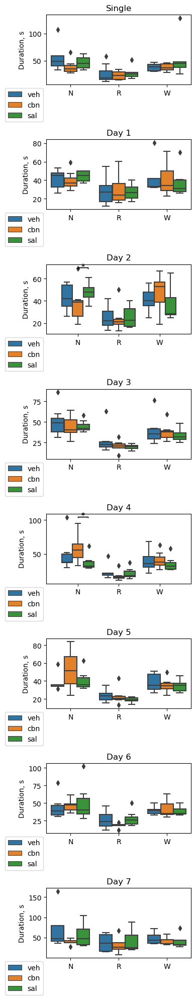

In [132]:
#now get results
#add signif to boxplots
injs = ['single', 'cont1','cont2','cont3','cont4','cont5','cont6','cont7']
fig, axs = plt.subplots(len(injs),1,figsize = (4,20))
for i, ax in enumerate(axs):
    to_plot = state_switches.loc[(state_switches['inj']==injs[i])&(~state_switches['group'].isin(w_exp))].groupby(['id','group','sleep']).median(numeric_only=True).reset_index()
    sns.boxplot(data = to_plot, x=  'sleep', y = 'duration', hue = 'group', ax = ax)
    ax.set(title= day_renaming_dict[injs[i]], xlabel = None, ylabel = 'Duration, s')
    ax.legend(bbox_to_anchor = (0,0))
    
    signif_times = []
    
    for sleep in to_plot['sleep'].unique():
        cbn = to_plot[(to_plot['group']=='cbn')&(to_plot['sleep']==sleep)]['duration']
        veh = to_plot[(to_plot['group']=='veh')&(to_plot['sleep']==sleep)]['duration']
        sal = to_plot[(to_plot['group']=='sal')&(to_plot['sleep']==sleep)]['duration'] 
        
        cbn = reject_outliers(cbn)
        veh = reject_outliers(veh)
        sal = reject_outliers(sal)

        print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
        if np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh) and np.mean(cbn) != np.mean(veh) and np.mean(cbn) != np.mean(sal) and np.mean(sal) != np.mean(veh):
            stat, p = stats.kruskal(cbn, veh, sal)
            if p < 0.05:
                print(f'kruskal of {sleep} significant')
                print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')                
                dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
                dunn_res.columns = ['cbn','veh','sal']
                dunn_res.index = ['cbn','veh','sal']
                if (dunn_res <= 0.05).any().any():
                    print(f'day {injs[i]}, sleep {sleep} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant')   
                    print(dunn_res)                
                    #add to list   
                    for p_col in dunn_res.columns:
                        for p_row in dunn_res.index:
                            p = dunn_res.loc[p_row, p_col]
                            if p < 0.05:
                                signif_times.append([sleep, p_row, p_col])
                    
                    print('\n')
                else:
                    print('posthoc ns')
    y = to_plot['duration'].max()
    h = 1            
    for result in signif_times:
        xmin = sleep_to_ind[result[0]]+group_to_ind[result[1]]
        xmax = sleep_to_ind[result[0]]+group_to_ind[result[2]]
        ax.plot([xmin, xmin, xmax, xmax], [y, y+h, y+h, y], linewidth=1, c='k')
        ax.text((xmin+xmax)*.5, y-h, "*", ha='center', va='bottom', color='k')
                    
plt.tight_layout()
plt.savefig('plots/state_duration_by_group_and_day.png')
plt.show()

In [133]:
#medians - ns
injs = ['single', 'cont1','cont2','cont3','cont4','cont5','cont6','cont7']
to_plot = state_switches.loc[(state_switches['inj'].isin(injs))&(~state_switches['group'].isin(w_exp))].groupby(['id','group','sleep']).median(numeric_only=True).reset_index()
# sns.boxplot(data = to_plot, x=  'sleep', y = 'duration', hue = 'group', ax = ax)
# ax.set(title = injs[i])
# ax.legend(loc = 'upper right')
for sleep in to_plot['sleep'].unique():
    cbn = to_plot[(to_plot['group']=='cbn')&(to_plot['sleep']==sleep)]['duration']
    veh = to_plot[(to_plot['group']=='veh')&(to_plot['sleep']==sleep)]['duration']
    sal = to_plot[(to_plot['group']=='sal')&(to_plot['sleep']==sleep)]['duration'] 
    
    cbn = reject_outliers(cbn)
    veh = reject_outliers(veh)
    sal = reject_outliers(sal)

    print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')
    if np.sum(cbn) != np.sum(veh) and np.sum(cbn) != np.sum(sal) and np.sum(sal) != np.sum(veh) and np.mean(cbn) != np.mean(veh) and np.mean(cbn) != np.mean(sal) and np.mean(sal) != np.mean(veh):
        stat, p = stats.kruskal(cbn, veh, sal)
        if p < 0.05:
            print(f'kruskal of {sleep} significant')
            print(f'n cbn: {len(cbn)}, n veh: {len(veh)}, n sal: {len(sal)}')                
            dunn_res = posthoc_dunn([cbn, veh, sal], p_adjust = 'bonferroni')
            dunn_res.columns = ['cbn','veh','sal']
            dunn_res.index = ['cbn','veh','sal']
            if (dunn_res <= 0.05).any().any():
                print(f'param {param}, comp {comp} \np = {p}, stat = {stat}\nDunn posthoc Bonferroni corr significant')   
                print(dunn_res)
                print('\n')
            else:
                print('posthoc ns')

n cbn: 7, n veh: 7, n sal: 7
found 1 outliers
found 1 outliers
n cbn: 7, n veh: 6, n sal: 6
found 1 outliers
n cbn: 7, n veh: 7, n sal: 6
